In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 22.3 MB/s eta 0:00:0000:01


In [2]:
import os
import random
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np  
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')


image = cv2.imread("/kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/train/images/10_jpg.rf.44251e9bfd3a03a724b19fbabff8b658.jpg")
h, w, c = image.shape
print(f"The image has dimensions {w}x{h} and {c} channels.")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
The image has dimensions 256x256 and 3 channels.


100%|██████████| 5.31M/5.31M [00:00<00:00, 91.7MB/s]



image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/train/images/10_jpg.rf.44251e9bfd3a03a724b19fbabff8b658.jpg: 640x640 (no detections), 7.7ms
Speed: 10.5ms preprocess, 7.7ms inference, 72.1ms postprocess per image at shape (1, 3, 640, 640)


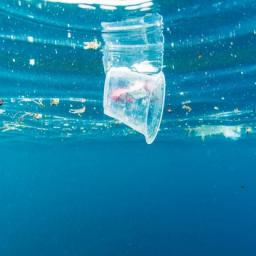

In [3]:
model = YOLO("yolov5nu.pt") 

# Use the model to detect object
image = "/kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/train/images/10_jpg.rf.44251e9bfd3a03a724b19fbabff8b658.jpg"
result_predict = model.predict(source = image, imgsz=(640))

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

In [4]:
from sklearn.model_selection import KFold
import shutil
import yaml

# Define number of folds
k_folds = 5
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Paths for images and labels
image_dir = "/kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/train/images/"
label_dir = "/kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/train/labels/"
image_paths = sorted(glob.glob(image_dir + "*.jpg"))
label_paths = sorted(glob.glob(label_dir + "*.txt"))

In [5]:
# Perform k-fold cross-validation
for fold, (train_idx, val_idx) in enumerate(kf.split(image_paths)):
    print(f"Training on Fold {fold+1}/{k_folds}...")

    # Define fold-specific working directory
    fold_dir = f"/kaggle/working/fold_{fold+1}/"
    fold_images_train = f"{fold_dir}/train/images/"
    fold_labels_train = f"{fold_dir}/train/labels/"
    fold_images_valid = f"{fold_dir}/valid/images/"
    fold_labels_valid = f"{fold_dir}/valid/labels/"

    # Create necessary directories
    os.makedirs(fold_images_train, exist_ok=True)
    os.makedirs(fold_labels_train, exist_ok=True)
    os.makedirs(fold_images_valid, exist_ok=True)
    os.makedirs(fold_labels_valid, exist_ok=True)

    # Copy training data
    for i in train_idx:
        shutil.copy(image_paths[i], fold_images_train)
        shutil.copy(label_paths[i], fold_labels_train)

    # Copy validation data
    for i in val_idx:
        shutil.copy(image_paths[i], fold_images_valid)
        shutil.copy(label_paths[i], fold_labels_valid)

    # Load and modify data.yaml
    with open("/kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/data.yaml", 'r') as file:
        data_yaml = yaml.safe_load(file)

    # Update paths in data.yaml
    data_yaml["train"] = f"{fold_dir}/train"
    data_yaml["val"] = f"{fold_dir}/valid"

    # Save modified data.yaml
    with open(f"{fold_dir}/data.yaml", 'w') as file:
        yaml.dump(data_yaml, file)

    # Train the model for this fold
    Fold_Model = YOLO('yolov5nu.yaml').load('yolov5nu.pt')
    Fold_Model.train(data=f"{fold_dir}/data.yaml", epochs=30, imgsz=640, batch=16, lr0=0.01, dropout=0.15, device=0, project=fold_dir, name="train")

    print(f"\nTraining for Fold {fold+1} completed.\n")

Training on Fold 1/5...
Transferred 427/427 items from pretrained weights
Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov5nu.yaml, data=/kaggle/working/fold_1//data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=/kaggle/working/fold_1/, name=train2, exist_ok=False, pretrained=yolov5nu.pt, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.15, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save

100%|██████████| 755k/755k [00:00<00:00, 25.4MB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1      1760  ultralytics.nn.modules.conv.Conv             [3, 16, 6, 2, 2]              
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      4800  ultralytics.nn.modules.block.C3              [32, 32, 1]                   
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     29184  ultralytics.nn.modules.block.C3              [64, 64, 2]                   
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  3    156928  ultralytics.nn.modules.block.C3              [128, 128, 3]                 
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 117MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/fold_1/train/labels... 5846 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5846/5846 [00:04<00:00, 1201.33it/s]


train: New cache created: /kaggle/working/fold_1/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/working/fold_1/valid/labels... 1462 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1462/1462 [00:01<00:00, 1124.76it/s]

val: WARNING ⚠️ /kaggle/working/fold_1/valid/images/obj1218_frame0000050_jpg.rf.4cc583ce533567da933951eafb1a3604.jpg: 1 duplicate labels removed
val: New cache created: /kaggle/working/fold_1/valid/labels.cache


Plotting labels to /kaggle/working/fold_1/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /kaggle/working/fold_1/train2
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.13G      1.515      2.676      1.625         18        640: 100%|██████████| 366/366 [01:02<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:10<00:00,  4.59it/s]


                   all       1462       2118      0.237      0.276      0.155     0.0586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      2.62G      1.607      2.253      1.698         22        640: 100%|██████████| 366/366 [00:59<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.27it/s]


                   all       1462       2118      0.353      0.302      0.243      0.101

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.62G      1.632      2.147      1.714         10        640: 100%|██████████| 366/366 [00:58<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.18it/s]


                   all       1462       2118      0.361      0.322      0.275      0.121

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      2.62G      1.594      2.039      1.682         16        640: 100%|██████████| 366/366 [00:58<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.35it/s]


                   all       1462       2118       0.45      0.407      0.388      0.194

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.62G      1.557      1.946      1.666         13        640: 100%|██████████| 366/366 [00:58<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:09<00:00,  4.65it/s]


                   all       1462       2118       0.36       0.24      0.217     0.0983

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.62G      1.531       1.85      1.627         16        640: 100%|██████████| 366/366 [00:57<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.36it/s]


                   all       1462       2118      0.547      0.455       0.45      0.236

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      2.62G      1.502      1.779      1.605         20        640: 100%|██████████| 366/366 [00:58<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.46it/s]

                   all       1462       2118      0.512      0.438      0.448      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      2.62G      1.466      1.734       1.59         14        640: 100%|██████████| 366/366 [00:57<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.37it/s]


                   all       1462       2118      0.579      0.487      0.513      0.284

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      2.62G      1.451       1.66      1.563         13        640: 100%|██████████| 366/366 [00:57<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.37it/s]

                   all       1462       2118      0.654      0.511      0.567      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.62G      1.436      1.604      1.553         16        640: 100%|██████████| 366/366 [00:57<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.44it/s]

                   all       1462       2118      0.636      0.527       0.58      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      2.62G      1.412      1.562      1.547         18        640: 100%|██████████| 366/366 [00:58<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.48it/s]

                   all       1462       2118       0.62      0.516      0.558       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      2.62G      1.413      1.538      1.538         17        640: 100%|██████████| 366/366 [00:58<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.44it/s]

                   all       1462       2118      0.685      0.529      0.604      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      2.62G       1.38      1.471      1.514         31        640: 100%|██████████| 366/366 [00:58<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.46it/s]


                   all       1462       2118      0.703      0.609      0.679      0.398

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      2.62G      1.352      1.423      1.495         16        640: 100%|██████████| 366/366 [00:57<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.30it/s]

                   all       1462       2118      0.719       0.57      0.658      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      2.62G      1.339      1.381      1.481         16        640: 100%|██████████| 366/366 [00:57<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.31it/s]

                   all       1462       2118      0.716      0.649      0.718      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.62G      1.334      1.361      1.484         13        640: 100%|██████████| 366/366 [00:57<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.32it/s]

                   all       1462       2118      0.724      0.621      0.697      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      2.62G      1.303      1.324      1.461         25        640: 100%|██████████| 366/366 [00:57<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.46it/s]


                   all       1462       2118      0.702      0.679      0.724      0.442

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      2.62G      1.295      1.295       1.45         12        640: 100%|██████████| 366/366 [00:57<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.43it/s]

                   all       1462       2118      0.753      0.654      0.738      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      2.62G       1.28      1.262      1.437         16        640: 100%|██████████| 366/366 [00:58<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.45it/s]

                   all       1462       2118      0.754      0.714      0.771       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.62G      1.271      1.228      1.432         29        640: 100%|██████████| 366/366 [00:57<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.49it/s]

                   all       1462       2118      0.755      0.705      0.772       0.49


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      2.62G      1.275      1.085      1.483          8        640: 100%|██████████| 366/366 [00:58<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.55it/s]

                   all       1462       2118      0.797      0.707      0.787      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      2.62G       1.24      1.017      1.443          7        640: 100%|██████████| 366/366 [00:57<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.48it/s]

                   all       1462       2118      0.798      0.731       0.78      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      2.62G       1.21     0.9606      1.419         13        640: 100%|██████████| 366/366 [00:57<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.54it/s]

                   all       1462       2118      0.782      0.754      0.802      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      2.62G      1.199     0.9422      1.415         24        640: 100%|██████████| 366/366 [00:57<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.43it/s]

                   all       1462       2118      0.773       0.79      0.813      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      2.62G      1.167      0.901      1.394          7        640: 100%|██████████| 366/366 [00:57<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.47it/s]

                   all       1462       2118      0.797       0.77       0.83      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      2.62G      1.152     0.8581      1.378         11        640: 100%|██████████| 366/366 [00:57<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.57it/s]

                   all       1462       2118      0.821      0.767      0.836      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      2.62G      1.137     0.8464       1.37         10        640: 100%|██████████| 366/366 [00:57<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.53it/s]

                   all       1462       2118      0.797      0.802       0.84      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      2.62G      1.115     0.8137      1.347          7        640: 100%|██████████| 366/366 [00:57<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.45it/s]

                   all       1462       2118      0.845      0.784      0.853      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      2.62G      1.101     0.7969      1.336          6        640: 100%|██████████| 366/366 [00:57<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.54it/s]

                   all       1462       2118      0.855      0.765      0.854      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      2.62G      1.084     0.7804      1.329         11        640: 100%|██████████| 366/366 [00:57<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.54it/s]

                   all       1462       2118      0.829      0.793       0.86      0.595



30 epochs completed in 0.559 hours.
Optimizer stripped from /kaggle/working/fold_1/train2/weights/last.pt, 5.3MB
Optimizer stripped from /kaggle/working/fold_1/train2/weights/best.pt, 5.3MB

Validating /kaggle/working/fold_1/train2/weights/best.pt...
Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:09<00:00,  4.77it/s]


                   all       1462       2118       0.83      0.793       0.86      0.595
                   Bio        323        473      0.824      0.757      0.842      0.591
                   Rov        225        278      0.748      0.784      0.818      0.605
                 Trash       1147       1367      0.917      0.838       0.92      0.589
Speed: 0.2ms preprocess, 2.1ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /kaggle/working/fold_1/train2

Training for Fold 1 completed.

Training on Fold 2/5...
Transferred 427/427 items from pretrained weights
Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov5nu.yaml, data=/kaggle/working/fold_2//data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=/kaggle/working/fold_2/, name=train2, exist_ok=False, pretrained=yolov5nu.pt, optimizer=auto, verb

train: Scanning /kaggle/working/fold_2/train/labels... 5846 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5846/5846 [00:04<00:00, 1216.00it/s]

train: WARNING ⚠️ /kaggle/working/fold_2/train/images/obj1218_frame0000050_jpg.rf.4cc583ce533567da933951eafb1a3604.jpg: 1 duplicate labels removed


train: New cache created: /kaggle/working/fold_2/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/working/fold_2/valid/labels... 1462 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1462/1462 [00:01<00:00, 1116.12it/s]


val: New cache created: /kaggle/working/fold_2/valid/labels.cache
Plotting labels to /kaggle/working/fold_2/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /kaggle/working/fold_2/train2
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.23G      1.513      2.669      1.623         19        640: 100%|██████████| 366/366 [01:02<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:09<00:00,  4.85it/s]


                   all       1462       2121      0.335      0.318      0.227      0.109

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      2.71G      1.601      2.245      1.687         21        640: 100%|██████████| 366/366 [00:59<00:00,  6.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.13it/s]


                   all       1462       2121      0.339      0.244      0.232      0.112

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.71G      1.635      2.161      1.707         10        640: 100%|██████████| 366/366 [00:58<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.31it/s]


                   all       1462       2121      0.275      0.338      0.237      0.112

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      2.71G      1.605      2.073      1.692         19        640: 100%|██████████| 366/366 [00:58<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.26it/s]


                   all       1462       2121      0.373      0.436      0.373      0.184

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.71G       1.56      1.981      1.659         13        640: 100%|██████████| 366/366 [00:57<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.36it/s]


                   all       1462       2121      0.437      0.456      0.402      0.202

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.71G      1.539      1.885      1.648         19        640: 100%|██████████| 366/366 [00:58<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.38it/s]


                   all       1462       2121      0.537       0.45      0.438      0.226

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      2.71G      1.511      1.796      1.623         19        640: 100%|██████████| 366/366 [00:58<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.38it/s]


                   all       1462       2121      0.529      0.451      0.447      0.238

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      2.71G       1.47      1.713      1.589         16        640: 100%|██████████| 366/366 [00:57<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.42it/s]


                   all       1462       2121       0.57      0.524      0.547      0.299

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      2.71G      1.444      1.656      1.563          9        640: 100%|██████████| 366/366 [00:57<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.42it/s]


                   all       1462       2121      0.595      0.522      0.545      0.304

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.71G      1.417      1.596      1.546         13        640: 100%|██████████| 366/366 [00:58<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.43it/s]

                   all       1462       2121      0.678      0.551      0.611       0.35



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      2.71G      1.422       1.57      1.541         14        640: 100%|██████████| 366/366 [00:58<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.30it/s]

                   all       1462       2121      0.721       0.62      0.682      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      2.71G      1.393      1.507       1.52         17        640: 100%|██████████| 366/366 [00:57<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.27it/s]

                   all       1462       2121      0.718       0.62      0.678      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      2.71G      1.373      1.448      1.511         27        640: 100%|██████████| 366/366 [00:57<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.33it/s]

                   all       1462       2121      0.718      0.618      0.674      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      2.71G      1.372      1.442      1.511         11        640: 100%|██████████| 366/366 [00:57<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.39it/s]

                   all       1462       2121       0.71      0.647      0.718       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      2.71G      1.347      1.398      1.484         10        640: 100%|██████████| 366/366 [00:59<00:00,  6.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.34it/s]

                   all       1462       2121       0.74      0.664      0.732      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.71G      1.327      1.365      1.488         18        640: 100%|██████████| 366/366 [00:58<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.39it/s]

                   all       1462       2121      0.702       0.68      0.709      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      2.71G      1.317       1.33      1.466         24        640: 100%|██████████| 366/366 [00:57<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.45it/s]


                   all       1462       2121      0.745      0.707      0.768      0.494

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      2.71G      1.305      1.284      1.454         18        640: 100%|██████████| 366/366 [00:58<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.43it/s]

                   all       1462       2121      0.745      0.713      0.772      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      2.71G      1.276       1.25      1.445         12        640: 100%|██████████| 366/366 [00:57<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.41it/s]

                   all       1462       2121       0.76      0.701      0.762      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.71G      1.283      1.241      1.442         21        640: 100%|██████████| 366/366 [00:58<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.41it/s]

                   all       1462       2121      0.817      0.722      0.813      0.533


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      2.71G      1.273      1.071       1.47          7        640: 100%|██████████| 366/366 [00:58<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.39it/s]

                   all       1462       2121      0.795      0.765      0.821       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      2.71G      1.242      1.006      1.448          6        640: 100%|██████████| 366/366 [00:57<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.46it/s]

                   all       1462       2121      0.828      0.758      0.835       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      2.71G      1.216     0.9547      1.426         13        640: 100%|██████████| 366/366 [00:57<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.55it/s]

                   all       1462       2121      0.818      0.764      0.833      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      2.71G        1.2     0.9301      1.417         15        640: 100%|██████████| 366/366 [00:57<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.35it/s]

                   all       1462       2121       0.81      0.762      0.835      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      2.71G      1.172     0.8991      1.386         18        640: 100%|██████████| 366/366 [00:57<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.48it/s]

                   all       1462       2121      0.825      0.799      0.853      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      2.71G       1.16     0.8648      1.374          8        640: 100%|██████████| 366/366 [00:57<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.39it/s]

                   all       1462       2121       0.84       0.79      0.856      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      2.71G      1.143      0.844      1.368         14        640: 100%|██████████| 366/366 [00:57<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.31it/s]

                   all       1462       2121      0.835      0.806      0.863      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      2.71G       1.12       0.81      1.351          9        640: 100%|██████████| 366/366 [00:57<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.38it/s]

                   all       1462       2121      0.843      0.811      0.872      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      2.71G      1.101     0.7892      1.342          6        640: 100%|██████████| 366/366 [00:57<00:00,  6.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.32it/s]

                   all       1462       2121      0.858      0.815      0.878      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      2.71G       1.09     0.7796      1.331         11        640: 100%|██████████| 366/366 [00:57<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.51it/s]

                   all       1462       2121      0.864      0.821      0.881      0.627



30 epochs completed in 0.560 hours.
Optimizer stripped from /kaggle/working/fold_2/train2/weights/last.pt, 5.3MB
Optimizer stripped from /kaggle/working/fold_2/train2/weights/best.pt, 5.3MB

Validating /kaggle/working/fold_2/train2/weights/best.pt...
Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:09<00:00,  4.98it/s]


                   all       1462       2121      0.865      0.819      0.881      0.627
                   Bio        329        449      0.903      0.824      0.891      0.636
                   Rov        227        303      0.785      0.835      0.863       0.68
                 Trash       1146       1369      0.907      0.799       0.89      0.566
Speed: 0.2ms preprocess, 2.1ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /kaggle/working/fold_2/train2

Training for Fold 2 completed.

Training on Fold 3/5...
Transferred 427/427 items from pretrained weights
Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov5nu.yaml, data=/kaggle/working/fold_3//data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=/kaggle/working/fold_3/, name=train2, exist_ok=False, pretrained=yolov5nu.pt, optimizer=auto, verb

train: Scanning /kaggle/working/fold_3/train/labels... 5846 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5846/5846 [00:04<00:00, 1227.97it/s]

train: WARNING ⚠️ /kaggle/working/fold_3/train/images/obj1218_frame0000050_jpg.rf.4cc583ce533567da933951eafb1a3604.jpg: 1 duplicate labels removed


train: New cache created: /kaggle/working/fold_3/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/working/fold_3/valid/labels... 1462 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1462/1462 [00:01<00:00, 1162.24it/s]

val: New cache created: /kaggle/working/fold_3/valid/labels.cache


Plotting labels to /kaggle/working/fold_3/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /kaggle/working/fold_3/train2
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.23G      1.519      2.667      1.617         18        640: 100%|██████████| 366/366 [01:02<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:09<00:00,  5.07it/s]


                   all       1462       2229       0.27      0.259       0.17     0.0755

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      2.71G      1.601       2.25      1.689         14        640: 100%|██████████| 366/366 [00:59<00:00,  6.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.35it/s]


                   all       1462       2229      0.435      0.368      0.325      0.157

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      2.71G       1.63      2.173      1.721          8        640: 100%|██████████| 366/366 [00:58<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.22it/s]


                   all       1462       2229      0.326       0.32       0.22     0.0976

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      2.71G      1.609      2.053       1.71         16        640: 100%|██████████| 366/366 [00:58<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.25it/s]


                   all       1462       2229      0.505      0.396       0.41      0.213

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      2.71G      1.569      1.971      1.674         10        640: 100%|██████████| 366/366 [00:58<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.32it/s]


                   all       1462       2229      0.459      0.376       0.37      0.182

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      2.71G      1.535       1.86      1.642         15        640: 100%|██████████| 366/366 [00:58<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.26it/s]


                   all       1462       2229      0.532      0.452      0.457      0.238

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      2.71G      1.498      1.792       1.62         18        640: 100%|██████████| 366/366 [00:58<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.18it/s]


                   all       1462       2229      0.546      0.432      0.458      0.244

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      2.71G      1.492      1.754       1.61         10        640: 100%|██████████| 366/366 [00:58<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.18it/s]


                   all       1462       2229      0.621      0.484      0.527      0.291

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      2.71G       1.45      1.673      1.575         13        640: 100%|██████████| 366/366 [00:58<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.40it/s]

                   all       1462       2229      0.631      0.554      0.602      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30      2.71G      1.411      1.592      1.549         16        640: 100%|██████████| 366/366 [00:58<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.40it/s]


                   all       1462       2229      0.687      0.583      0.631      0.369

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      2.71G      1.409      1.554      1.551         12        640: 100%|██████████| 366/366 [00:58<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.34it/s]

                   all       1462       2229      0.651       0.59      0.642       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      2.71G      1.388      1.502      1.531         17        640: 100%|██████████| 366/366 [00:58<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.46it/s]

                   all       1462       2229      0.719      0.597      0.687      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      2.71G      1.368      1.466      1.511         21        640: 100%|██████████| 366/366 [00:58<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.39it/s]


                   all       1462       2229      0.698      0.641      0.709       0.43

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      2.71G      1.358      1.428      1.505         11        640: 100%|██████████| 366/366 [00:57<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.33it/s]

                   all       1462       2229      0.721      0.636      0.713      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      2.71G      1.332      1.393       1.49         12        640: 100%|██████████| 366/366 [00:57<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.41it/s]

                   all       1462       2229      0.767      0.625      0.719      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      2.71G      1.323      1.357      1.484         18        640: 100%|██████████| 366/366 [00:58<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.44it/s]

                   all       1462       2229      0.742      0.668      0.746      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      2.71G      1.319      1.339      1.473         19        640: 100%|██████████| 366/366 [00:58<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.42it/s]

                   all       1462       2229      0.793      0.618      0.743       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      2.71G      1.298      1.283      1.454          8        640: 100%|██████████| 366/366 [00:58<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.41it/s]

                   all       1462       2229      0.765      0.689      0.771      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      2.71G      1.287      1.259       1.45         16        640: 100%|██████████| 366/366 [00:57<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.31it/s]

                   all       1462       2229      0.785       0.69      0.782      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      2.71G      1.266      1.237       1.44         18        640: 100%|██████████| 366/366 [00:57<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.31it/s]

                   all       1462       2229      0.808      0.689      0.794      0.521


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30      2.71G      1.264      1.072      1.473         10        640: 100%|██████████| 366/366 [00:58<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.28it/s]

                   all       1462       2229      0.799      0.704      0.804      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      2.71G      1.243      1.019      1.455          7        640: 100%|██████████| 366/366 [00:57<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.46it/s]

                   all       1462       2229      0.787      0.734      0.806      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      2.71G      1.221      0.965      1.434          9        640: 100%|██████████| 366/366 [00:57<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.46it/s]

                   all       1462       2229      0.815      0.728       0.82      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      2.71G      1.196     0.9244      1.413          8        640: 100%|██████████| 366/366 [00:57<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.49it/s]

                   all       1462       2229      0.836       0.74       0.84      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      2.71G      1.178     0.8911      1.403          8        640: 100%|██████████| 366/366 [00:57<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.44it/s]

                   all       1462       2229      0.806      0.774      0.841      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      2.71G      1.153     0.8596      1.374          7        640: 100%|██████████| 366/366 [00:57<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.46it/s]

                   all       1462       2229      0.837       0.76      0.847      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30      2.71G      1.146     0.8404      1.376         10        640: 100%|██████████| 366/366 [00:57<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.33it/s]

                   all       1462       2229      0.827      0.782      0.856      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30      2.71G      1.115     0.8073      1.353          9        640: 100%|██████████| 366/366 [00:58<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.40it/s]

                   all       1462       2229      0.819      0.792      0.852       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30      2.71G      1.099     0.7849      1.341          6        640: 100%|██████████| 366/366 [00:57<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.44it/s]

                   all       1462       2229      0.843      0.784      0.864      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30      2.71G       1.09     0.7732      1.333          7        640: 100%|██████████| 366/366 [00:57<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.48it/s]

                   all       1462       2229      0.845      0.796      0.868      0.612



30 epochs completed in 0.560 hours.
Optimizer stripped from /kaggle/working/fold_3/train2/weights/last.pt, 5.3MB
Optimizer stripped from /kaggle/working/fold_3/train2/weights/best.pt, 5.3MB

Validating /kaggle/working/fold_3/train2/weights/best.pt...
Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:09<00:00,  4.86it/s]


                   all       1462       2229      0.845      0.796      0.868      0.612
                   Bio        311        482      0.772       0.78      0.846      0.599
                   Rov        248        320      0.859      0.809      0.878       0.67
                 Trash       1165       1427      0.903        0.8      0.879      0.566
Speed: 0.2ms preprocess, 2.1ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to /kaggle/working/fold_3/train2

Training for Fold 3 completed.

Training on Fold 4/5...
Transferred 427/427 items from pretrained weights
Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov5nu.yaml, data=/kaggle/working/fold_4//data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=/kaggle/working/fold_4/, name=train2, exist_ok=False, pretrained=yolov5nu.pt, optimizer=auto, verb

train: Scanning /kaggle/working/fold_4/train/labels... 5847 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5847/5847 [00:04<00:00, 1195.96it/s]

train: WARNING ⚠️ /kaggle/working/fold_4/train/images/obj1218_frame0000050_jpg.rf.4cc583ce533567da933951eafb1a3604.jpg: 1 duplicate labels removed


train: New cache created: /kaggle/working/fold_4/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/working/fold_4/valid/labels... 1461 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1461/1461 [00:01<00:00, 1117.62it/s]

val: New cache created: /kaggle/working/fold_4/valid/labels.cache


Plotting labels to /kaggle/working/fold_4/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /kaggle/working/fold_4/train2
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.21G      1.523       2.66      1.627         13        640: 100%|██████████| 366/366 [01:02<00:00,  5.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:09<00:00,  4.76it/s]


                   all       1461       2281      0.304      0.346      0.264      0.123

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30       2.7G      1.599      2.249      1.697         38        640: 100%|██████████| 366/366 [00:58<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.16it/s]


                   all       1461       2281      0.351       0.34      0.262      0.119

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30       2.7G      1.628      2.169      1.717         29        640: 100%|██████████| 366/366 [00:58<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.31it/s]


                   all       1461       2281      0.326       0.31      0.238      0.106

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30       2.7G      1.582      2.083      1.689         23        640: 100%|██████████| 366/366 [00:57<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.46it/s]

                   all       1461       2281      0.485      0.394      0.385      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30       2.7G      1.559      1.971      1.664         21        640: 100%|██████████| 366/366 [00:58<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.36it/s]


                   all       1461       2281      0.496      0.444      0.437      0.228

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30       2.7G      1.525      1.875      1.642         14        640: 100%|██████████| 366/366 [00:57<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.37it/s]


                   all       1461       2281      0.496      0.468      0.447       0.23

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30       2.7G      1.492      1.791      1.609         16        640: 100%|██████████| 366/366 [00:57<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.37it/s]


                   all       1461       2281      0.549      0.485      0.491       0.26

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30       2.7G      1.471      1.722      1.592         13        640: 100%|██████████| 366/366 [00:58<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.28it/s]


                   all       1461       2281      0.585      0.499      0.535      0.303

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30       2.7G      1.448      1.673      1.578         17        640: 100%|██████████| 366/366 [00:58<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.30it/s]

                   all       1461       2281      0.591      0.451      0.491      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30       2.7G      1.434      1.636      1.564         20        640: 100%|██████████| 366/366 [00:58<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.35it/s]


                   all       1461       2281      0.661       0.57      0.626      0.366

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30       2.7G      1.403      1.569      1.546         13        640: 100%|██████████| 366/366 [00:57<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.22it/s]


                   all       1461       2281      0.737      0.577      0.679      0.397

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30       2.7G      1.381      1.535      1.531         18        640: 100%|██████████| 366/366 [00:58<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.30it/s]

                   all       1461       2281      0.717      0.611      0.694      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30       2.7G      1.375      1.481      1.511         15        640: 100%|██████████| 366/366 [00:58<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.23it/s]


                   all       1461       2281      0.672      0.598      0.659      0.387

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30       2.7G      1.352      1.454      1.511         18        640: 100%|██████████| 366/366 [00:58<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.17it/s]

                   all       1461       2281      0.695      0.623      0.676      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30       2.7G      1.337      1.393      1.483         22        640: 100%|██████████| 366/366 [00:57<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.20it/s]

                   all       1461       2281      0.696      0.657      0.709       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30       2.7G      1.314      1.352      1.473         19        640: 100%|██████████| 366/366 [00:57<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.30it/s]

                   all       1461       2281      0.787      0.648      0.758      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30       2.7G      1.325      1.328      1.472         29        640: 100%|██████████| 366/366 [00:57<00:00,  6.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.42it/s]

                   all       1461       2281      0.764      0.698      0.773      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30       2.7G      1.282      1.261       1.45         23        640: 100%|██████████| 366/366 [00:58<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.30it/s]

                   all       1461       2281      0.744      0.718      0.781      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30       2.7G      1.268      1.246      1.439         18        640: 100%|██████████| 366/366 [00:59<00:00,  6.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.26it/s]

                   all       1461       2281      0.793      0.694      0.786       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30       2.7G      1.267      1.235      1.445         12        640: 100%|██████████| 366/366 [00:58<00:00,  6.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.27it/s]

                   all       1461       2281      0.782      0.711      0.791      0.523


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30       2.7G      1.264      1.063      1.474          7        640: 100%|██████████| 366/366 [00:58<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.29it/s]

                   all       1461       2281      0.833      0.735      0.822      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30       2.7G      1.232     0.9877      1.446         13        640: 100%|██████████| 366/366 [00:57<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.47it/s]

                   all       1461       2281      0.813      0.759      0.831      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30       2.7G      1.209     0.9552      1.429         12        640: 100%|██████████| 366/366 [00:57<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.37it/s]

                   all       1461       2281      0.842      0.755      0.843      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30       2.7G      1.193     0.9265      1.415          8        640: 100%|██████████| 366/366 [00:57<00:00,  6.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.48it/s]

                   all       1461       2281      0.814       0.78      0.844      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30       2.7G      1.166     0.8901      1.399          7        640: 100%|██████████| 366/366 [00:57<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.42it/s]

                   all       1461       2281      0.823       0.78      0.839      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30       2.7G      1.158     0.8679      1.389         20        640: 100%|██████████| 366/366 [00:57<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.37it/s]

                   all       1461       2281      0.835        0.8      0.858      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30       2.7G      1.135     0.8265       1.37          9        640: 100%|██████████| 366/366 [00:57<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.36it/s]

                   all       1461       2281      0.838        0.8      0.859      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30       2.7G      1.112     0.8046       1.35         10        640: 100%|██████████| 366/366 [00:58<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.39it/s]

                   all       1461       2281      0.837      0.808      0.866      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30       2.7G      1.094     0.7863       1.34          7        640: 100%|██████████| 366/366 [00:57<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.32it/s]

                   all       1461       2281      0.852      0.809      0.874      0.615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30       2.7G       1.08     0.7629      1.327         11        640: 100%|██████████| 366/366 [00:57<00:00,  6.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.32it/s]

                   all       1461       2281      0.827      0.823      0.871      0.619



30 epochs completed in 0.560 hours.
Optimizer stripped from /kaggle/working/fold_4/train2/weights/last.pt, 5.3MB
Optimizer stripped from /kaggle/working/fold_4/train2/weights/best.pt, 5.3MB

Validating /kaggle/working/fold_4/train2/weights/best.pt...
Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:09<00:00,  4.86it/s]


                   all       1461       2281      0.828      0.822      0.871       0.62
                   Bio        330        453      0.818      0.811      0.877      0.639
                   Rov        224        283      0.768      0.894      0.876      0.672
                 Trash       1153       1545      0.898      0.762      0.859      0.549
Speed: 0.2ms preprocess, 2.1ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /kaggle/working/fold_4/train2

Training for Fold 4 completed.

Training on Fold 5/5...
Transferred 427/427 items from pretrained weights
Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov5nu.yaml, data=/kaggle/working/fold_5//data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=/kaggle/working/fold_5/, name=train2, exist_ok=False, pretrained=yolov5nu.pt, optimizer=auto, verb

train: Scanning /kaggle/working/fold_5/train/labels... 5847 images, 0 backgrounds, 0 corrupt: 100%|██████████| 5847/5847 [00:04<00:00, 1202.40it/s]

train: WARNING ⚠️ /kaggle/working/fold_5/train/images/obj1218_frame0000050_jpg.rf.4cc583ce533567da933951eafb1a3604.jpg: 1 duplicate labels removed


train: New cache created: /kaggle/working/fold_5/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/working/fold_5/valid/labels... 1461 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1461/1461 [00:01<00:00, 1063.48it/s]

val: New cache created: /kaggle/working/fold_5/valid/labels.cache


Plotting labels to /kaggle/working/fold_5/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /kaggle/working/fold_5/train2
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      2.22G      1.522      2.669      1.632         13        640: 100%|██████████| 366/366 [01:01<00:00,  5.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:09<00:00,  4.84it/s]


                   all       1461       2123      0.233      0.242      0.171     0.0705

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30       2.7G      1.605      2.269      1.705         34        640: 100%|██████████| 366/366 [00:59<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.29it/s]


                   all       1461       2123      0.353      0.319      0.269      0.126

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30       2.7G      1.621      2.175      1.713         27        640: 100%|██████████| 366/366 [00:58<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.34it/s]


                   all       1461       2123      0.383      0.392      0.333      0.155

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30       2.7G       1.62      2.107      1.705         21        640: 100%|██████████| 366/366 [00:58<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.20it/s]


                   all       1461       2123      0.419      0.418      0.357      0.168

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30       2.7G      1.567       1.94      1.659         18        640: 100%|██████████| 366/366 [00:58<00:00,  6.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.35it/s]

                   all       1461       2123      0.514       0.47      0.455      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30       2.7G      1.521      1.866      1.621         12        640: 100%|██████████| 366/366 [00:58<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.32it/s]

                   all       1461       2123      0.501      0.474      0.461      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30       2.7G      1.513      1.813      1.617         22        640: 100%|██████████| 366/366 [00:58<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.22it/s]


                   all       1461       2123      0.486      0.495      0.495      0.267

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30       2.7G      1.471       1.72      1.583         14        640: 100%|██████████| 366/366 [00:58<00:00,  6.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.17it/s]


                   all       1461       2123      0.581       0.51      0.534      0.285

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30       2.7G      1.459      1.652      1.576         36        640: 100%|██████████| 366/366 [00:57<00:00,  6.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.24it/s]


                   all       1461       2123      0.572      0.563      0.586      0.341

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30       2.7G      1.422      1.607      1.553         18        640: 100%|██████████| 366/366 [00:58<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:09<00:00,  5.11it/s]


                   all       1461       2123      0.661      0.601      0.649      0.364

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30       2.7G      1.419      1.563       1.54         11        640: 100%|██████████| 366/366 [00:59<00:00,  6.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.24it/s]

                   all       1461       2123      0.686      0.585      0.635      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30       2.7G      1.393      1.537      1.522         19        640: 100%|██████████| 366/366 [00:58<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.33it/s]

                   all       1461       2123      0.681      0.579      0.643      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30       2.7G      1.381       1.47       1.51         17        640: 100%|██████████| 366/366 [00:58<00:00,  6.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.42it/s]

                   all       1461       2123      0.724      0.648      0.693      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30       2.7G      1.366      1.427      1.502         19        640: 100%|██████████| 366/366 [00:57<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.41it/s]

                   all       1461       2123      0.753      0.631      0.715      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30       2.7G      1.354      1.391      1.495         22        640: 100%|██████████| 366/366 [00:58<00:00,  6.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.38it/s]

                   all       1461       2123      0.677      0.606      0.662      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30       2.7G      1.324      1.367      1.482         22        640: 100%|██████████| 366/366 [00:58<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.35it/s]

                   all       1461       2123      0.711      0.607      0.674      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30       2.7G      1.328      1.337      1.477         14        640: 100%|██████████| 366/366 [00:58<00:00,  6.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.39it/s]

                   all       1461       2123       0.77      0.674      0.747      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30       2.7G      1.296      1.294      1.449         12        640: 100%|██████████| 366/366 [00:57<00:00,  6.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.50it/s]

                   all       1461       2123      0.788      0.684      0.771      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30       2.7G      1.293      1.275      1.452         36        640: 100%|██████████| 366/366 [00:58<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.17it/s]


                   all       1461       2123      0.801      0.697       0.79      0.518

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30       2.7G      1.274      1.237      1.442         14        640: 100%|██████████| 366/366 [00:59<00:00,  6.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.14it/s]

                   all       1461       2123      0.842      0.685      0.797       0.52


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30       2.7G       1.27      1.081      1.476          8        640: 100%|██████████| 366/366 [00:58<00:00,  6.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.20it/s]

                   all       1461       2123      0.813      0.731      0.808      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30       2.7G      1.248      1.008       1.45         11        640: 100%|██████████| 366/366 [00:57<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.24it/s]

                   all       1461       2123      0.814      0.756      0.828      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30       2.7G      1.216     0.9762      1.431          6        640: 100%|██████████| 366/366 [00:57<00:00,  6.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.36it/s]

                   all       1461       2123      0.823      0.773      0.843      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30       2.7G      1.194     0.9449      1.416          7        640: 100%|██████████| 366/366 [00:57<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.40it/s]

                   all       1461       2123      0.847      0.779      0.862      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30       2.7G       1.18     0.8982      1.405         10        640: 100%|██████████| 366/366 [00:57<00:00,  6.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.55it/s]

                   all       1461       2123      0.863       0.78       0.86        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30       2.7G      1.165     0.8838      1.389          8        640: 100%|██████████| 366/366 [00:57<00:00,  6.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.44it/s]

                   all       1461       2123       0.87      0.781      0.865      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/30       2.7G      1.136     0.8457      1.363          9        640: 100%|██████████| 366/366 [00:57<00:00,  6.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.43it/s]

                   all       1461       2123      0.852      0.797      0.873      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/30       2.7G      1.114     0.8213      1.346         17        640: 100%|██████████| 366/366 [00:58<00:00,  6.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.39it/s]

                   all       1461       2123       0.88      0.795      0.876      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/30       2.7G      1.098     0.7934      1.338         16        640: 100%|██████████| 366/366 [00:58<00:00,  6.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.28it/s]

                   all       1461       2123      0.883      0.783      0.881      0.628



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/30       2.7G      1.081     0.7747       1.33          8        640: 100%|██████████| 366/366 [00:58<00:00,  6.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:08<00:00,  5.47it/s]

                   all       1461       2123      0.854      0.824      0.885      0.634



30 epochs completed in 0.563 hours.
Optimizer stripped from /kaggle/working/fold_5/train2/weights/last.pt, 5.3MB
Optimizer stripped from /kaggle/working/fold_5/train2/weights/best.pt, 5.3MB

Validating /kaggle/working/fold_5/train2/weights/best.pt...
Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 46/46 [00:09<00:00,  4.76it/s]


                   all       1461       2123      0.855      0.824      0.885      0.634
                   Bio        279        380      0.852      0.771      0.845       0.63
                   Rov        241        304      0.818      0.872      0.903      0.695
                 Trash       1187       1439      0.896      0.829      0.906      0.578
Speed: 0.2ms preprocess, 2.2ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to /kaggle/working/fold_5/train2

Training for Fold 5 completed.



In [6]:
# After training, perform validation separately
for fold in range(k_folds):
    fold_dir = f"/kaggle/working/fold_{fold+1}/"

    print(f"\nValidating Fold {fold+1}...\n")

    # Load the best model for this fold
    Fold_Valid_Model = YOLO(f'{fold_dir}/train2/weights/best.pt')

    # Evaluate the model on the validation set
    metrics = Fold_Valid_Model.val(split='val', project=fold_dir, name="val")

    # Display results
    print(f"Fold {fold+1} Results:")
    print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
    print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
    print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
    print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])


Validating Fold 1...

Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


val: Scanning /kaggle/working/fold_1/valid/labels.cache... 1462 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1462/1462 [00:00<?, ?it/s]

val: WARNING ⚠️ /kaggle/working/fold_1/valid/images/obj1218_frame0000050_jpg.rf.4cc583ce533567da933951eafb1a3604.jpg: 1 duplicate labels removed



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:12<00:00,  7.40it/s]


                   all       1462       2118      0.829      0.793       0.86      0.595
                   Bio        323        473      0.824      0.757      0.843       0.59
                   Rov        225        278      0.748      0.784      0.818      0.606
                 Trash       1147       1367      0.915      0.838      0.919      0.589
Speed: 0.4ms preprocess, 4.4ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to /kaggle/working/fold_1/val
Fold 1 Results:
precision(B):  0.8290481400761452
metrics/recall(B):  0.7929653862507386
metrics/mAP50(B):  0.8601542033231236
metrics/mAP50-95(B):  0.5948344903430202

Validating Fold 2...

Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


val: Scanning /kaggle/working/fold_2/valid/labels.cache... 1462 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1462/1462 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:12<00:00,  7.36it/s]


                   all       1462       2121       0.87      0.817      0.881      0.628
                   Bio        329        449      0.907       0.82      0.891      0.637
                   Rov        227        303      0.793      0.835      0.863       0.68
                 Trash       1146       1369       0.91      0.797      0.889      0.566
Speed: 0.4ms preprocess, 4.4ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /kaggle/working/fold_2/val
Fold 2 Results:
precision(B):  0.8699580496182141
metrics/recall(B):  0.8173411611556892
metrics/mAP50(B):  0.8812474321341813
metrics/mAP50-95(B):  0.627575937654923

Validating Fold 3...

Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


val: Scanning /kaggle/working/fold_3/valid/labels.cache... 1462 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1462/1462 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:12<00:00,  7.38it/s]


                   all       1462       2229      0.845      0.797      0.868      0.611
                   Bio        311        482      0.773       0.78      0.846      0.597
                   Rov        248        320      0.858      0.809      0.878       0.67
                 Trash       1165       1427      0.905        0.8       0.88      0.565
Speed: 0.4ms preprocess, 4.4ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /kaggle/working/fold_3/val
Fold 3 Results:
precision(B):  0.8453012834866831
metrics/recall(B):  0.7965794319636802
metrics/mAP50(B):  0.8681311858518086
metrics/mAP50-95(B):  0.6108683199172037

Validating Fold 4...

Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


val: Scanning /kaggle/working/fold_4/valid/labels.cache... 1461 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1461/1461 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:12<00:00,  7.27it/s]


                   all       1461       2281      0.827      0.822      0.871       0.62
                   Bio        330        453      0.818      0.811      0.877      0.639
                   Rov        224        283      0.764      0.894      0.876      0.671
                 Trash       1153       1545      0.898      0.762      0.859      0.549
Speed: 0.4ms preprocess, 4.4ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to /kaggle/working/fold_4/val
Fold 4 Results:
precision(B):  0.8266085805513859
metrics/recall(B):  0.8223770731334517
metrics/mAP50(B):  0.8705724936769682
metrics/mAP50-95(B):  0.6195479787967331

Validating Fold 5...

Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


val: Scanning /kaggle/working/fold_5/valid/labels.cache... 1461 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1461/1461 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:12<00:00,  7.48it/s]


                   all       1461       2123      0.856      0.823      0.885      0.635
                   Bio        279        380      0.855      0.771      0.845      0.629
                   Rov        241        304      0.817      0.868      0.903      0.696
                 Trash       1187       1439      0.896      0.829      0.906      0.578
Speed: 0.4ms preprocess, 4.3ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /kaggle/working/fold_5/val
Fold 5 Results:
precision(B):  0.856096833809811
metrics/recall(B):  0.8227524456869384
metrics/mAP50(B):  0.8847735432467472
metrics/mAP50-95(B):  0.6345016340921437


In [8]:
# Initialize lists to store metrics for overall results
overall_precision = []
overall_recall = []
overall_map50 = []
overall_map50_95 = []
# After training, perform validation separately
for fold in range(k_folds):
    fold_dir = f"/kaggle/working/fold_{fold+1}/"

    print(f"\nValidating Fold {fold+1}...\n")

    # Load the best model for this fold
    Fold_Valid_Model = YOLO(f'{fold_dir}/train2/weights/best.pt')

    # Evaluate the model on the validation set
    metrics = Fold_Valid_Model.val(split='val', project=fold_dir, name="val")

    # Extract and store results
    precision = metrics.results_dict["metrics/precision(B)"]
    recall = metrics.results_dict["metrics/recall(B)"]
    map50 = metrics.results_dict["metrics/mAP50(B)"]
    map50_95 = metrics.results_dict["metrics/mAP50-95(B)"]

    overall_precision.append(precision)
    overall_recall.append(recall)
    overall_map50.append(map50)
    overall_map50_95.append(map50_95)

    # Display results for each fold
    print(f"Fold {fold+1} Results:")
    print(f"Precision(B): {precision:.4f}")
    print(f"Recall(B): {recall:.4f}")
    print(f"mAP50(B): {map50:.4f}")
    print(f"mAP50-95(B): {map50_95:.4f}")

# Calculate and display overall results
print("\nOverall Results Across All Folds:")
print(f"Average Precision(B): {np.mean(overall_precision):.4f} ± {np.std(overall_precision):.4f}")
print(f"Average Recall(B): {np.mean(overall_recall):.4f} ± {np.std(overall_recall):.4f}")
print(f"Average mAP50(B): {np.mean(overall_map50):.4f} ± {np.std(overall_map50):.4f}")
print(f"Average mAP50-95(B): {np.mean(overall_map50_95):.4f} ± {np.std(overall_map50_95):.4f}")


Validating Fold 1...

Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


val: Scanning /kaggle/working/fold_1/valid/labels.cache... 1462 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1462/1462 [00:00<?, ?it/s]

val: WARNING ⚠️ /kaggle/working/fold_1/valid/images/obj1218_frame0000050_jpg.rf.4cc583ce533567da933951eafb1a3604.jpg: 1 duplicate labels removed



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:12<00:00,  7.37it/s]


                   all       1462       2118      0.829      0.793       0.86      0.595
                   Bio        323        473      0.824      0.757      0.843       0.59
                   Rov        225        278      0.748      0.784      0.818      0.606
                 Trash       1147       1367      0.915      0.838      0.919      0.589
Speed: 0.4ms preprocess, 4.4ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to /kaggle/working/fold_1/val3
Fold 1 Results:
Precision(B): 0.8290
Recall(B): 0.7930
mAP50(B): 0.8602
mAP50-95(B): 0.5948

Validating Fold 2...

Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


val: Scanning /kaggle/working/fold_2/valid/labels.cache... 1462 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1462/1462 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:12<00:00,  7.38it/s]


                   all       1462       2121       0.87      0.817      0.881      0.628
                   Bio        329        449      0.907       0.82      0.891      0.637
                   Rov        227        303      0.793      0.835      0.863       0.68
                 Trash       1146       1369       0.91      0.797      0.889      0.566
Speed: 0.4ms preprocess, 4.4ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to /kaggle/working/fold_2/val2
Fold 2 Results:
Precision(B): 0.8700
Recall(B): 0.8173
mAP50(B): 0.8812
mAP50-95(B): 0.6276

Validating Fold 3...

Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


val: Scanning /kaggle/working/fold_3/valid/labels.cache... 1462 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1462/1462 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:12<00:00,  7.30it/s]


                   all       1462       2229      0.845      0.797      0.868      0.611
                   Bio        311        482      0.773       0.78      0.846      0.597
                   Rov        248        320      0.858      0.809      0.878       0.67
                 Trash       1165       1427      0.905        0.8       0.88      0.565
Speed: 0.4ms preprocess, 4.4ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to /kaggle/working/fold_3/val2
Fold 3 Results:
Precision(B): 0.8453
Recall(B): 0.7966
mAP50(B): 0.8681
mAP50-95(B): 0.6109

Validating Fold 4...

Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


val: Scanning /kaggle/working/fold_4/valid/labels.cache... 1461 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1461/1461 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:12<00:00,  7.35it/s]


                   all       1461       2281      0.827      0.822      0.871       0.62
                   Bio        330        453      0.818      0.811      0.877      0.639
                   Rov        224        283      0.764      0.894      0.876      0.671
                 Trash       1153       1545      0.898      0.762      0.859      0.549
Speed: 0.4ms preprocess, 4.3ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /kaggle/working/fold_4/val2
Fold 4 Results:
Precision(B): 0.8266
Recall(B): 0.8224
mAP50(B): 0.8706
mAP50-95(B): 0.6195

Validating Fold 5...

Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


val: Scanning /kaggle/working/fold_5/valid/labels.cache... 1461 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1461/1461 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:12<00:00,  7.54it/s]


                   all       1461       2123      0.856      0.823      0.885      0.635
                   Bio        279        380      0.855      0.771      0.845      0.629
                   Rov        241        304      0.817      0.868      0.903      0.696
                 Trash       1187       1439      0.896      0.829      0.906      0.578
Speed: 0.4ms preprocess, 4.3ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /kaggle/working/fold_5/val2
Fold 5 Results:
Precision(B): 0.8561
Recall(B): 0.8228
mAP50(B): 0.8848
mAP50-95(B): 0.6345

Overall Results Across All Folds:
Average Precision(B): 0.8454 ± 0.0164
Average Recall(B): 0.8104 ± 0.0130
Average mAP50(B): 0.8730 ± 0.0090
Average mAP50-95(B): 0.6175 ± 0.0138


In [10]:
# Calculate and display overall results
print("\nOverall Results Across All Folds:")
print(f"Average Precision(B): {round(np.mean(overall_precision), 4)}")
print(f"Average Recall(B): {round(np.mean(overall_recall), 4)}")
print(f"Average mAP50(B): {round(np.mean(overall_map50), 4)}")
print(f"Average mAP50-95(B): {round(np.mean(overall_map50_95), 4)}")



Overall Results Across All Folds:
Average Precision(B): 0.8454
Average Recall(B): 0.8104
Average mAP50(B): 0.873
Average mAP50-95(B): 0.6175



Displaying Metrics for Fold 1...



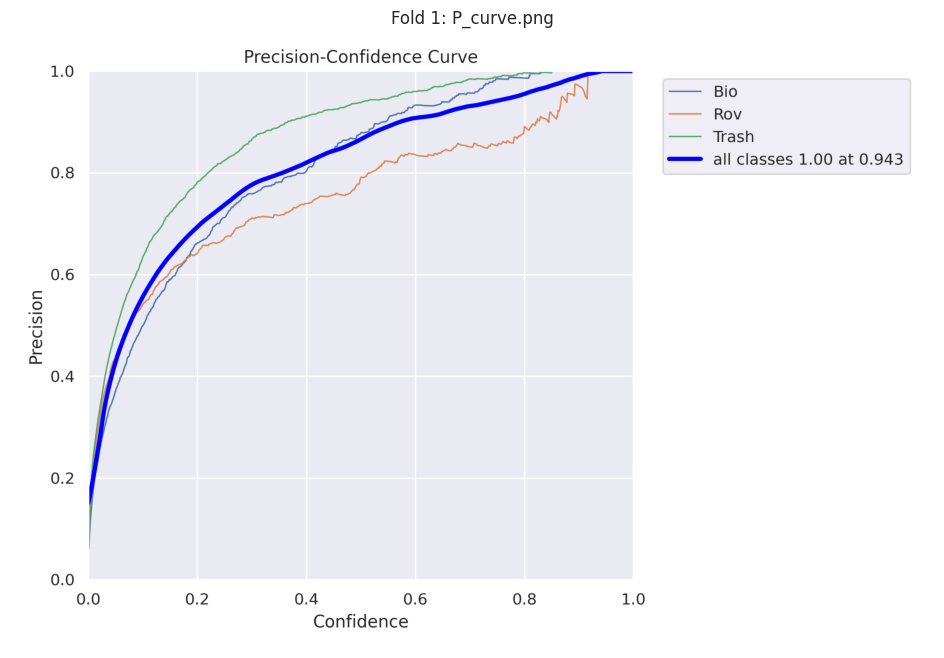

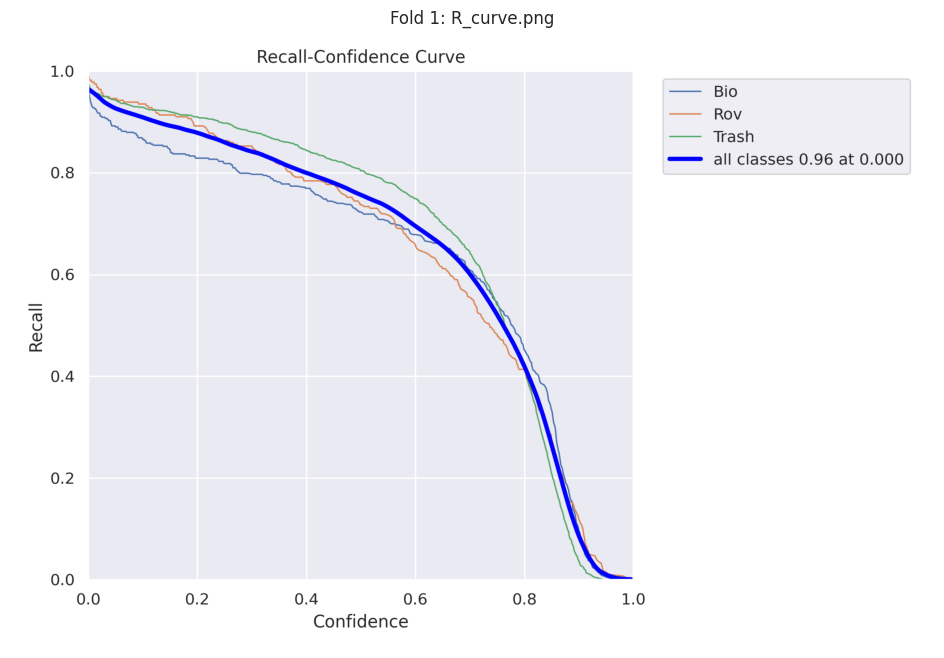

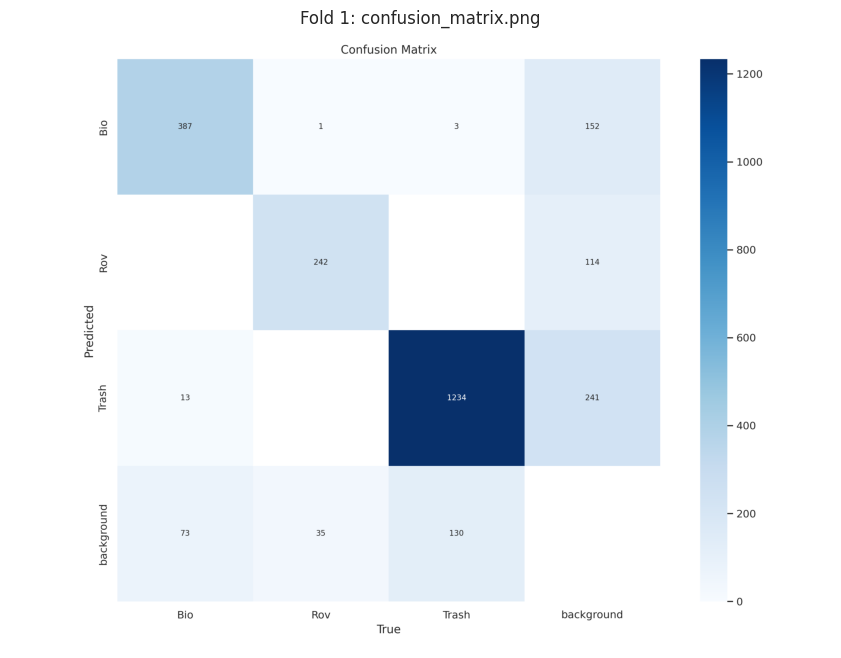


Displaying Metrics for Fold 2...



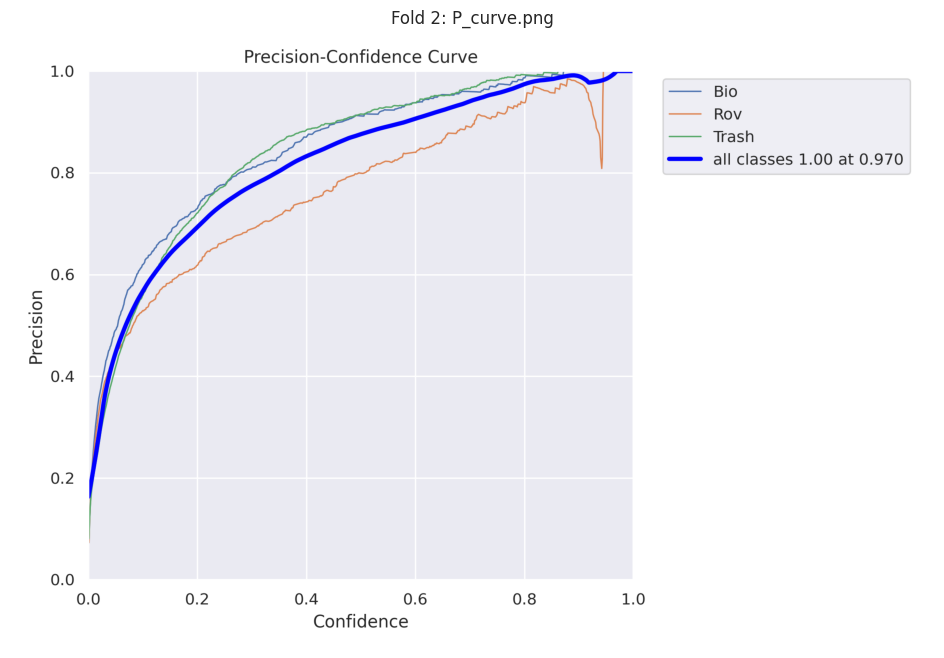

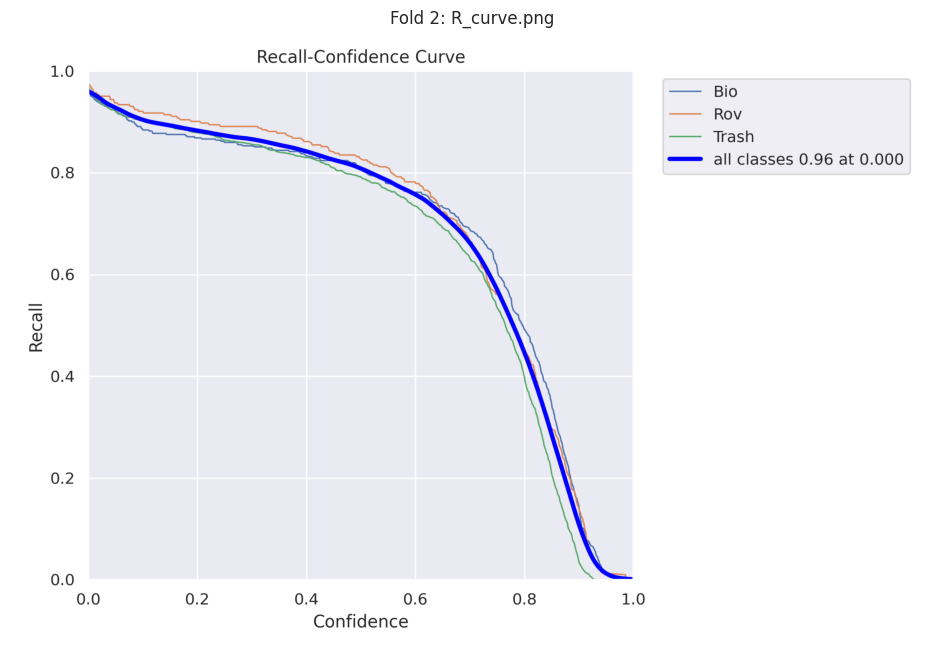

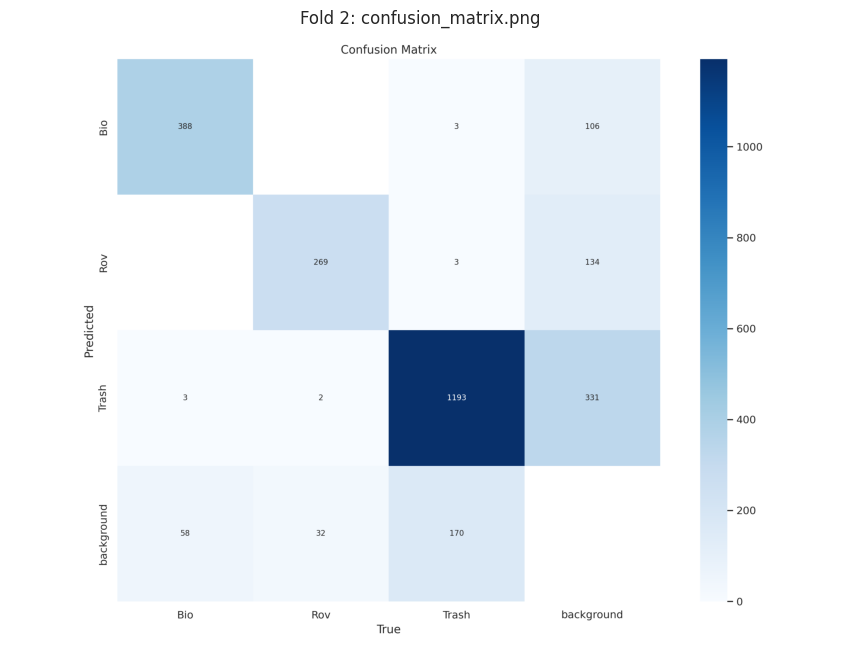


Displaying Metrics for Fold 3...



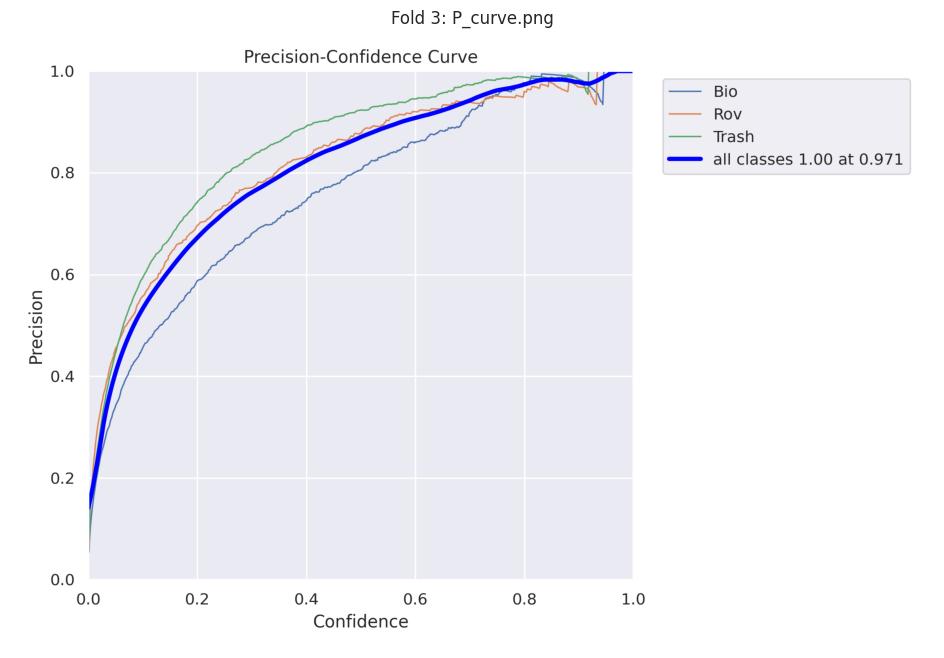

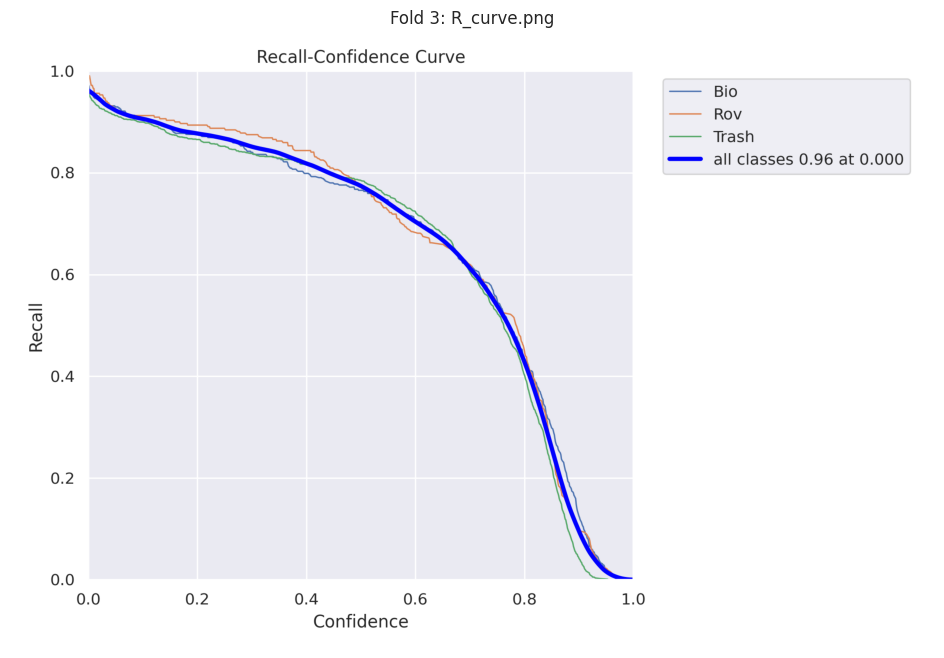

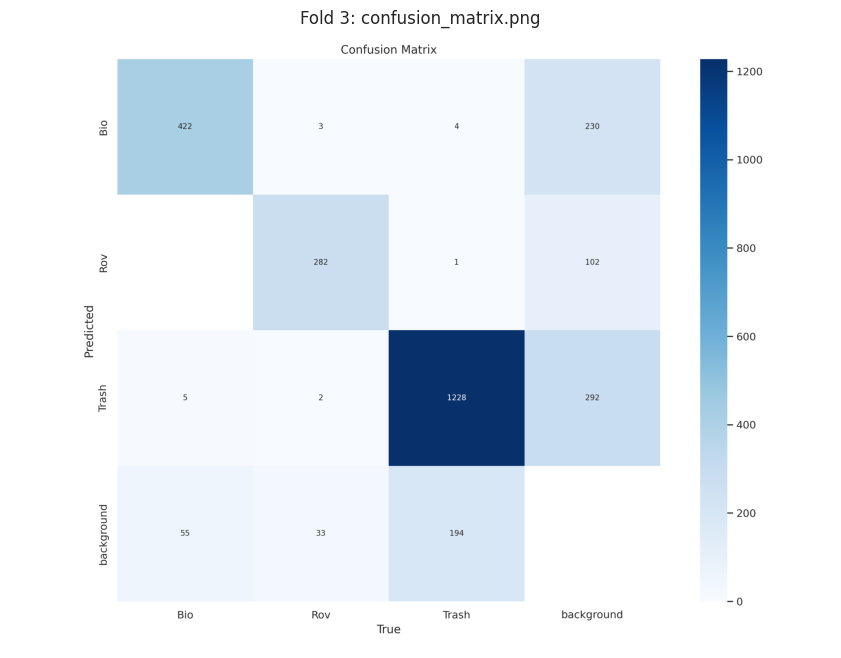


Displaying Metrics for Fold 4...



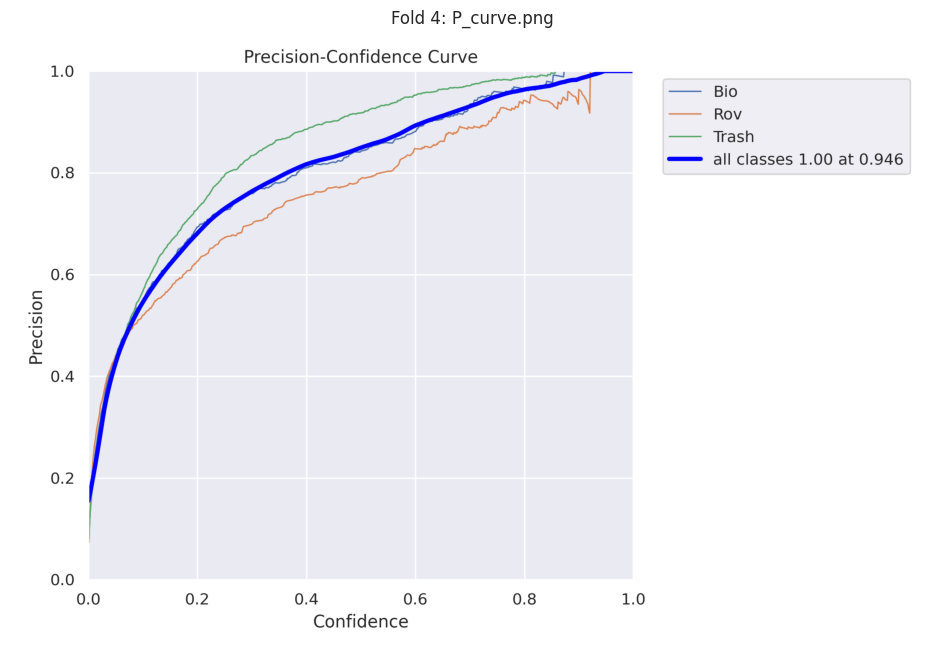

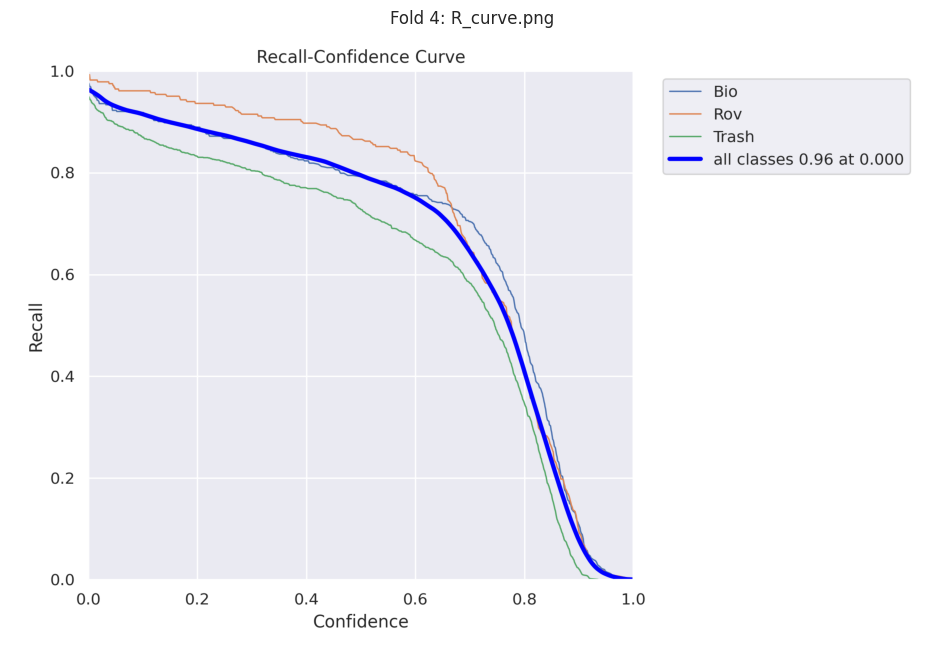

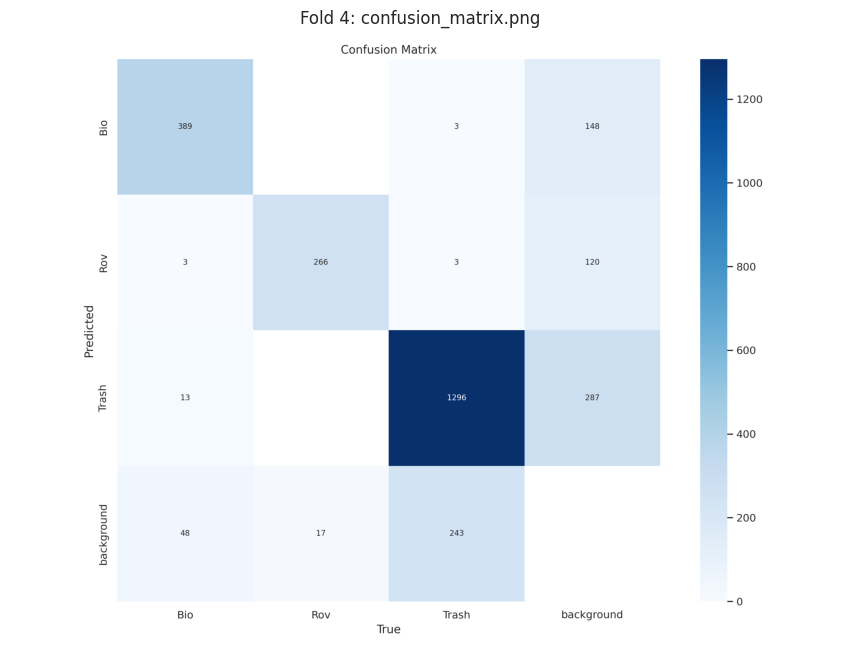


Displaying Metrics for Fold 5...



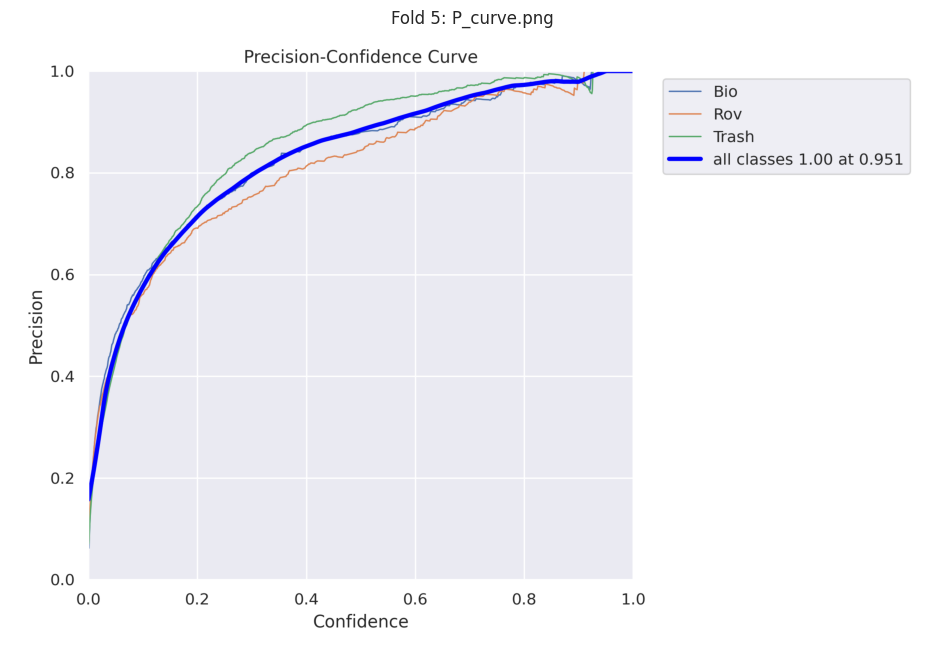

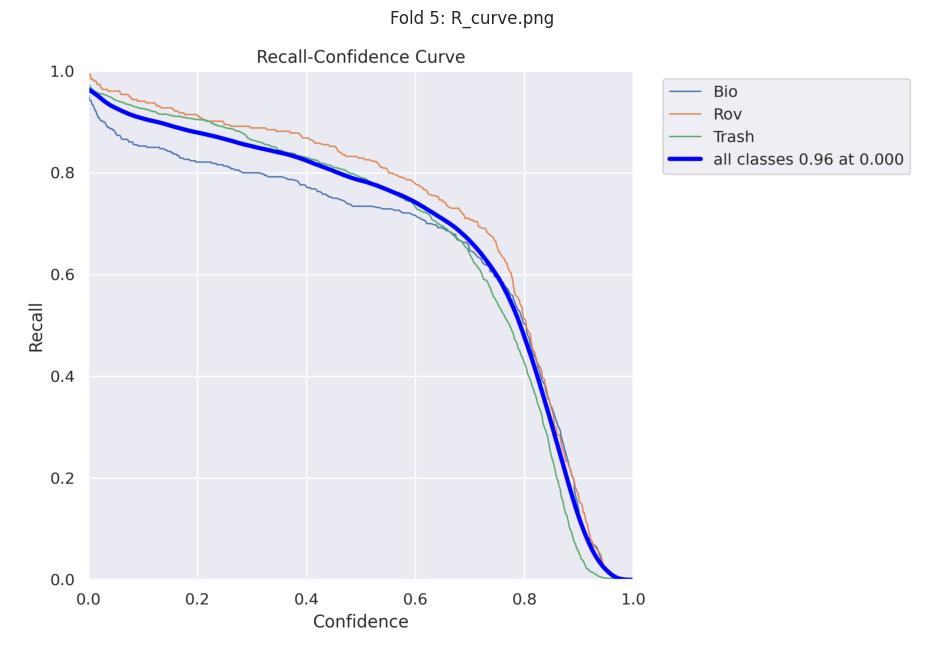

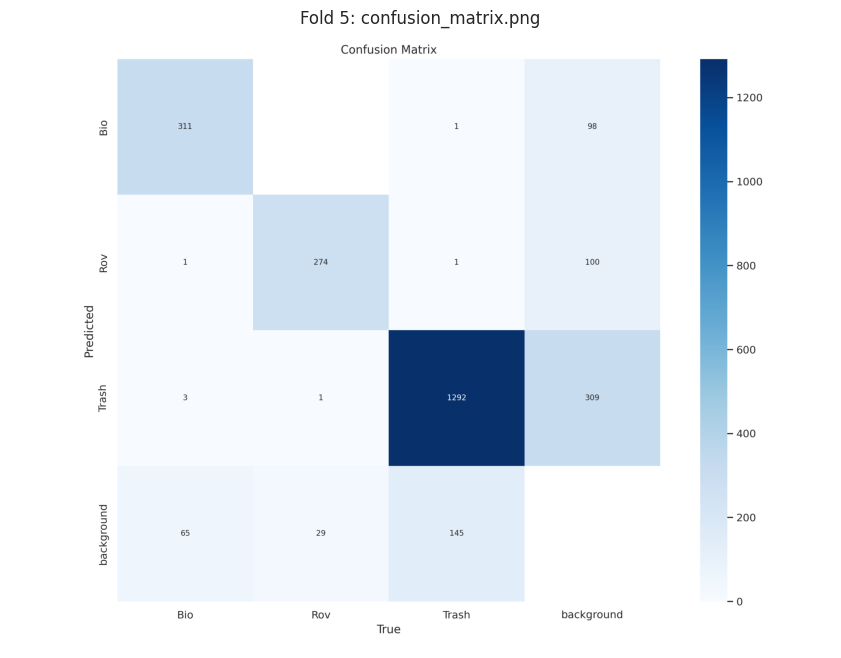


Displaying Overall Metrics...



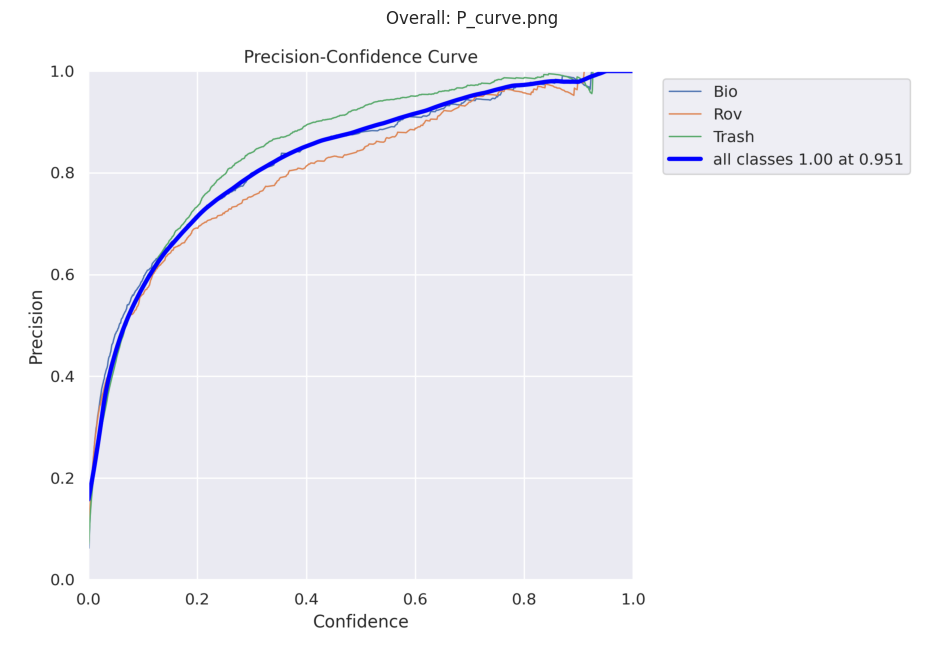

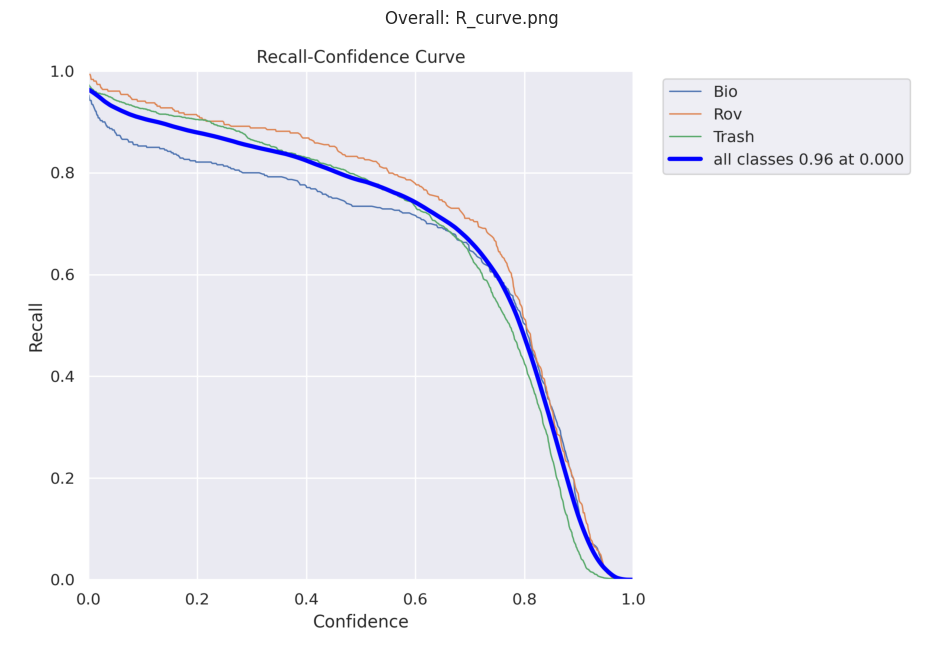

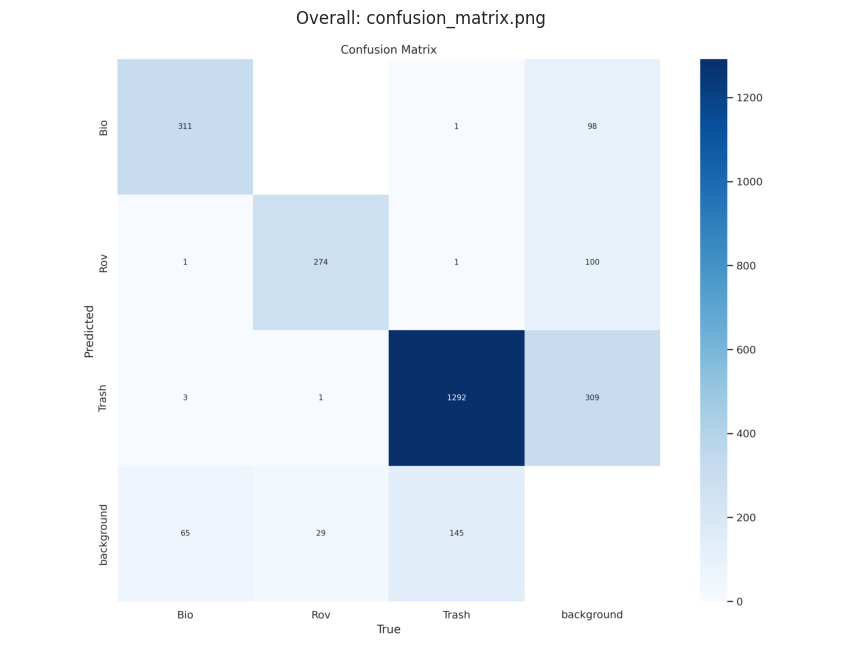

In [12]:
import cv2
import matplotlib.pyplot as plt

list_of_metrics = ["P_curve.png", "R_curve.png", "confusion_matrix.png"]

for fold in range(1, k_folds + 1):  # Iterate through folds
    print(f"\nDisplaying Metrics for Fold {fold}...\n")
    
    for metric in list_of_metrics:
        metric_path = f"/kaggle/working/fold_{fold}/val/{metric}"  # Adjusted path

        img = cv2.imread(metric_path)
        if img is not None:
            plt.figure(figsize=(12, 8))
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert from BGR to RGB
            plt.axis("off")
            plt.title(f"Fold {fold}: {metric}")
            plt.show()
        else:
            print(f"Warning: {metric} not found for Fold {fold}.")

# Display overall results from the last fold directory (or any centralized directory)
print("\nDisplaying Overall Metrics...\n")

for metric in list_of_metrics:
    overall_path = f"/kaggle/working/fold_{k_folds}/val/{metric}"  # Using last fold directory

    img = cv2.imread(overall_path)
    if img is not None:
        plt.figure(figsize=(12, 8))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert from BGR to RGB
        plt.axis("off")
        plt.title(f"Overall: {metric}")
        plt.show()
    else:
        print(f"Warning: {metric} not found for Overall Results.")


In [13]:
import pandas as pd
import os

# Initialize lists to store overall results across folds
overall_results = []

for fold in range(1, k_folds + 1):
    file_path = f"/kaggle/working/fold_{fold}/train2/results.csv"  # Path for each fold
    
    if os.path.exists(file_path):  # Check if the file exists
        print(f"\nLoading Results for Fold {fold}...\n")
        
        results = pd.read_csv(file_path)
        results.columns = results.columns.str.strip()  # Remove extra spaces in column names
        overall_results.append(results)
        
        # Display first few rows for each fold
        print(results.head())
    else:
        print(f"Warning: Results file not found for Fold {fold}.")

# Concatenate results from all folds
if overall_results:
    overall_df = pd.concat(overall_results, ignore_index=True)

    # Compute overall mean results
    overall_mean = overall_df.mean(numeric_only=True).round(4)
    
    print("\nOverall Average Results Across All Folds:")
    print(overall_mean)
else:
    print("No results found across folds.")



Loading Results for Fold 1...

   epoch      time  train/box_loss  train/cls_loss  train/dfl_loss  \
0      1   76.9198         1.51467         2.67648         1.62458   
1      2  145.1080         1.60699         2.25299         1.69831   
2      3  212.6910         1.63174         2.14689         1.71370   
3      4  279.8150         1.59418         2.03870         1.68179   
4      5  348.2280         1.55742         1.94596         1.66650   

   metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
0               0.23661            0.27567           0.15548   
1               0.35345            0.30240           0.24326   
2               0.36083            0.32167           0.27532   
3               0.44965            0.40660           0.38778   
4               0.36043            0.24005           0.21656   

   metrics/mAP50-95(B)  val/box_loss  val/cls_loss  val/dfl_loss    lr/pg0  \
0              0.05858       1.96073       3.74121       2.14196  0.000475   
1     


Loading and Plotting Results for Fold 1...



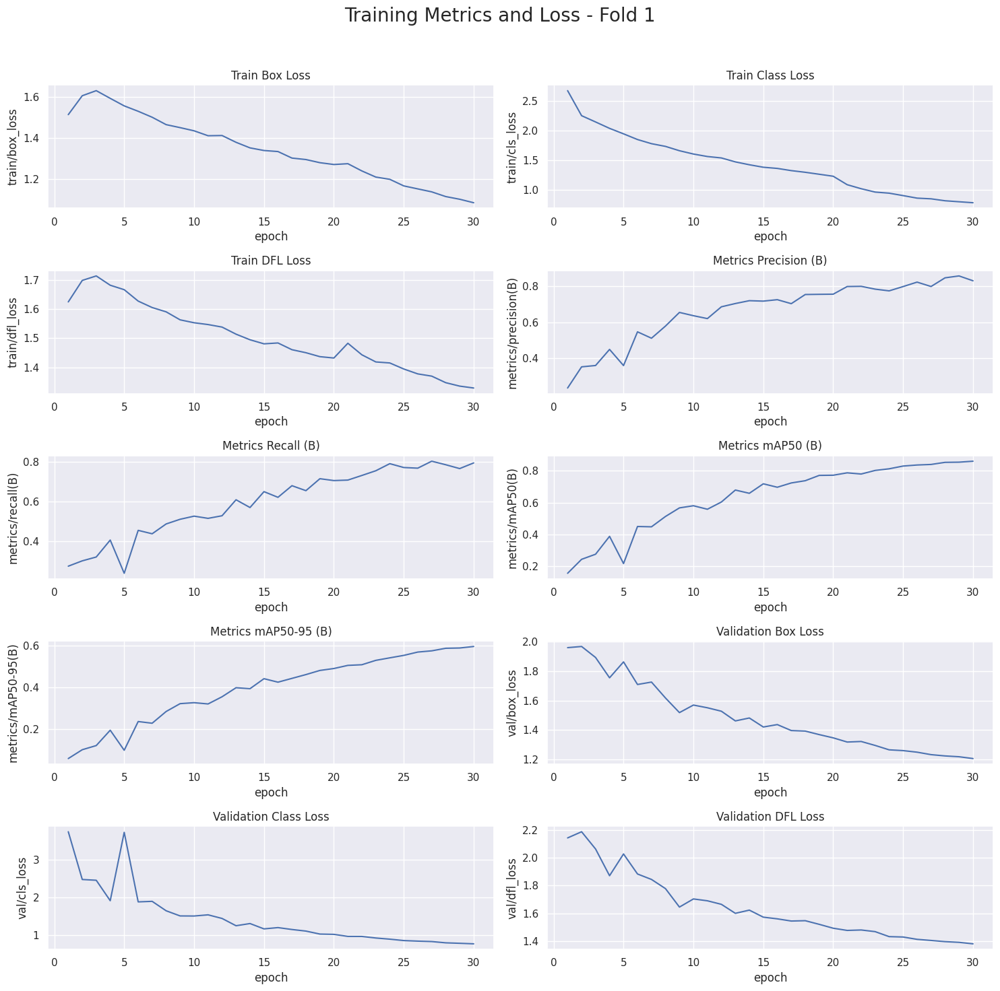


Loading and Plotting Results for Fold 2...



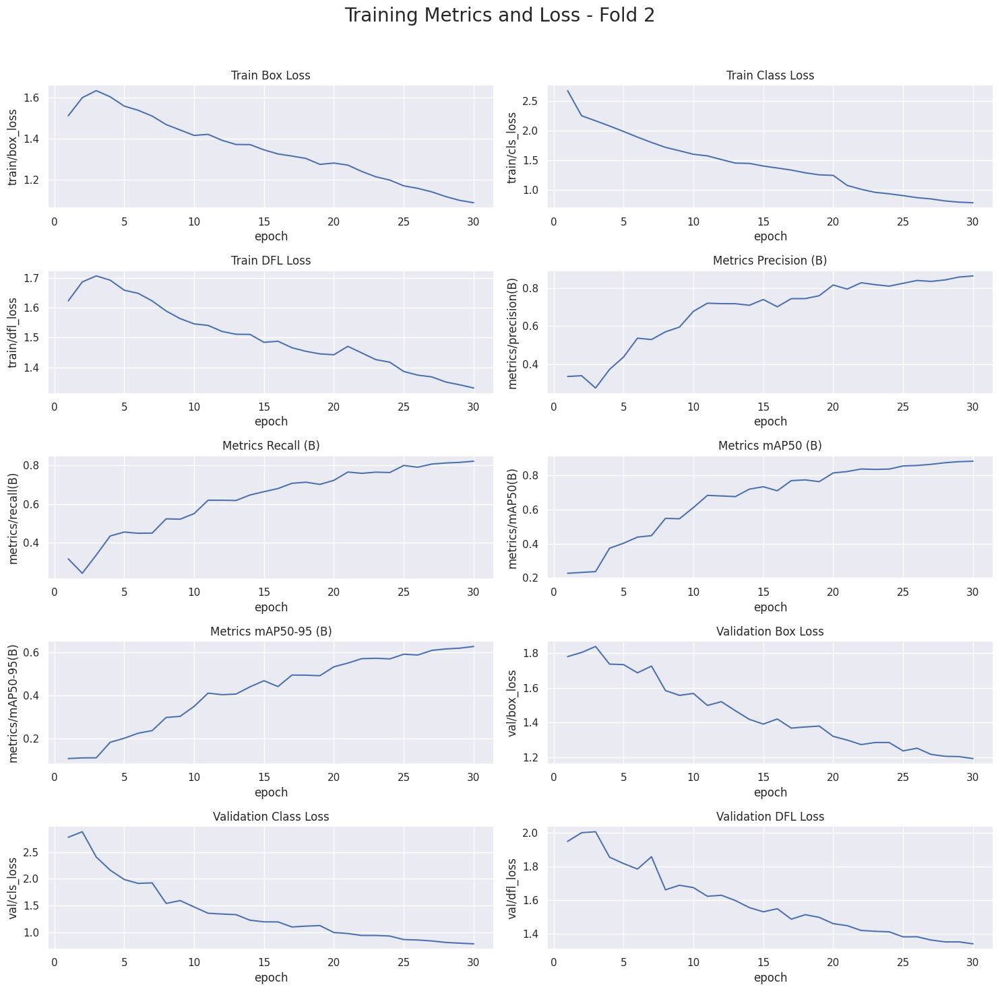


Loading and Plotting Results for Fold 3...



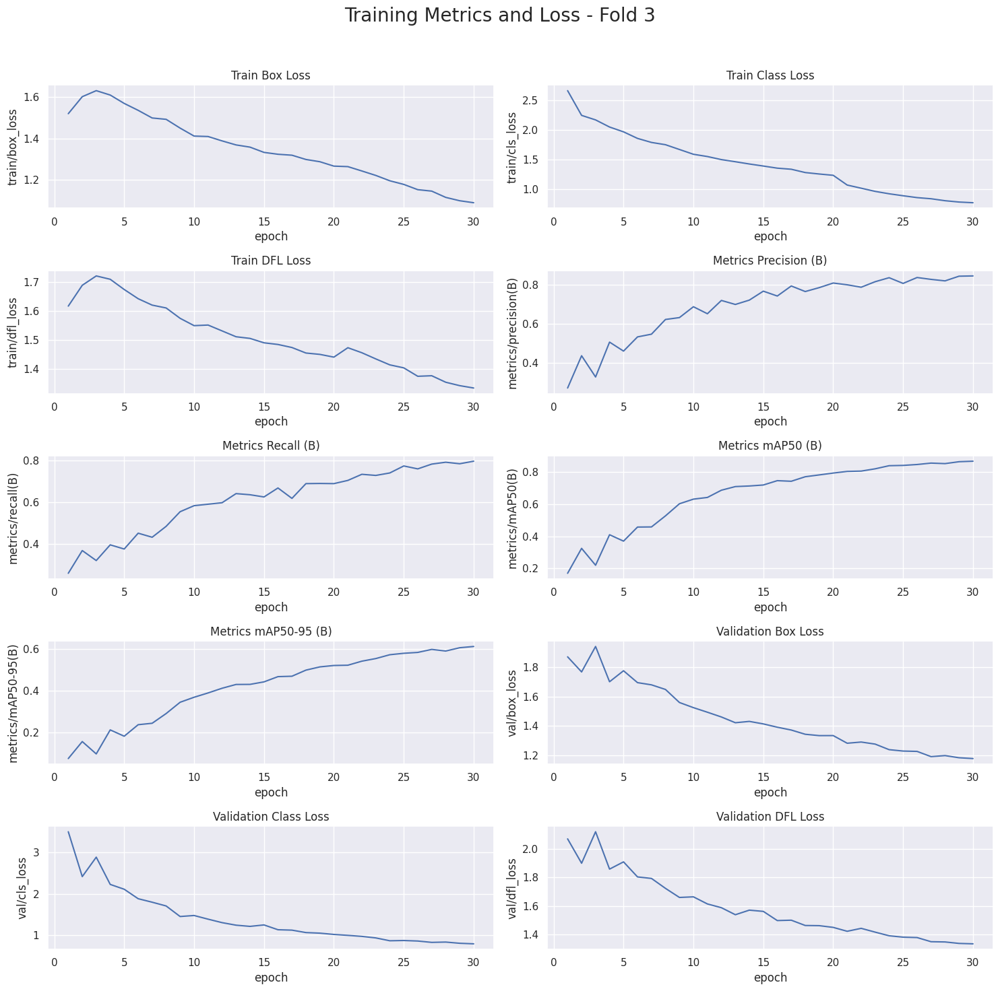


Loading and Plotting Results for Fold 4...



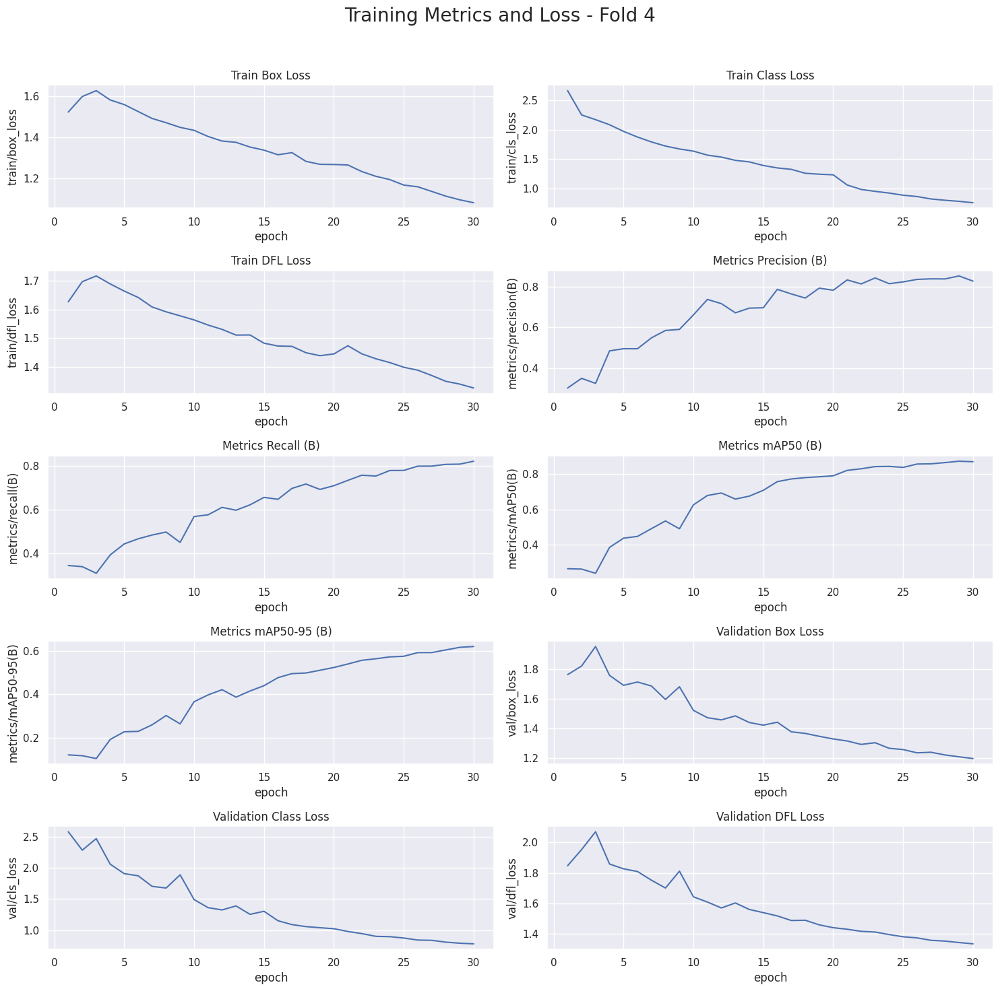


Loading and Plotting Results for Fold 5...



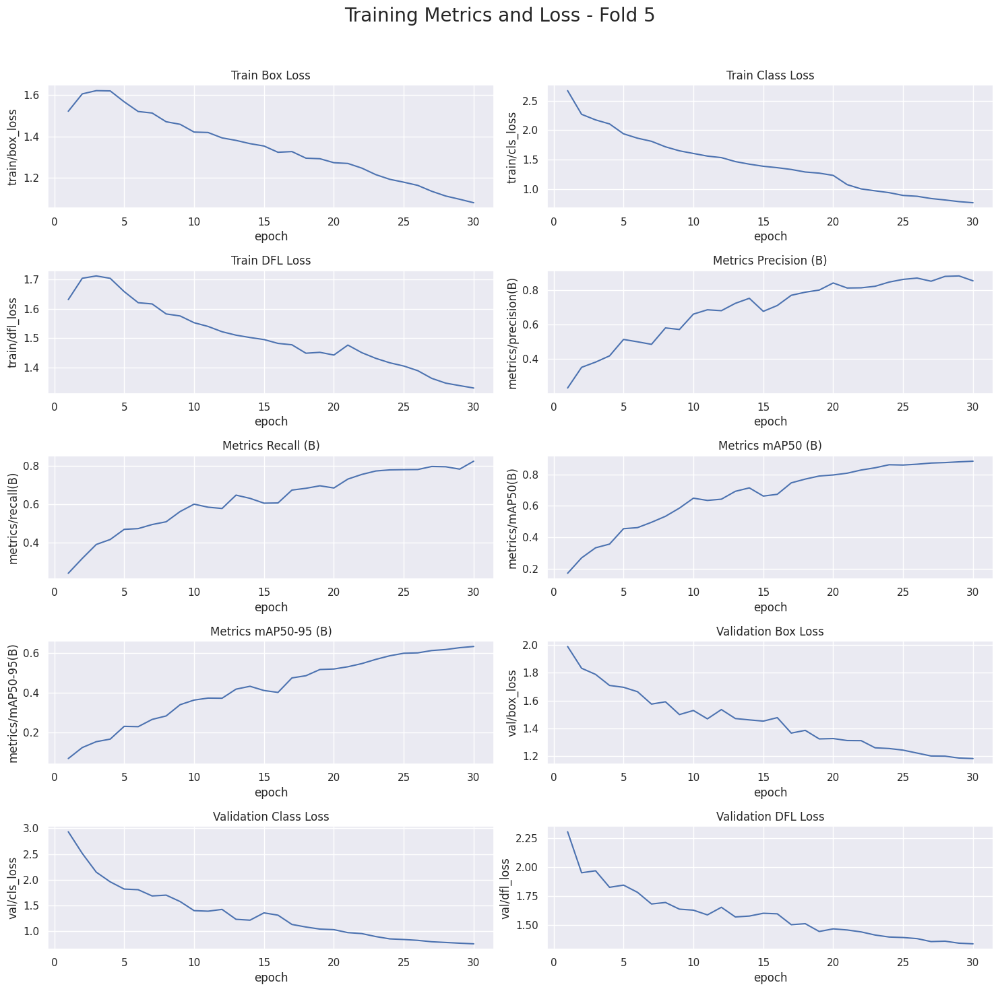


Plotting Overall Results Across All Folds...



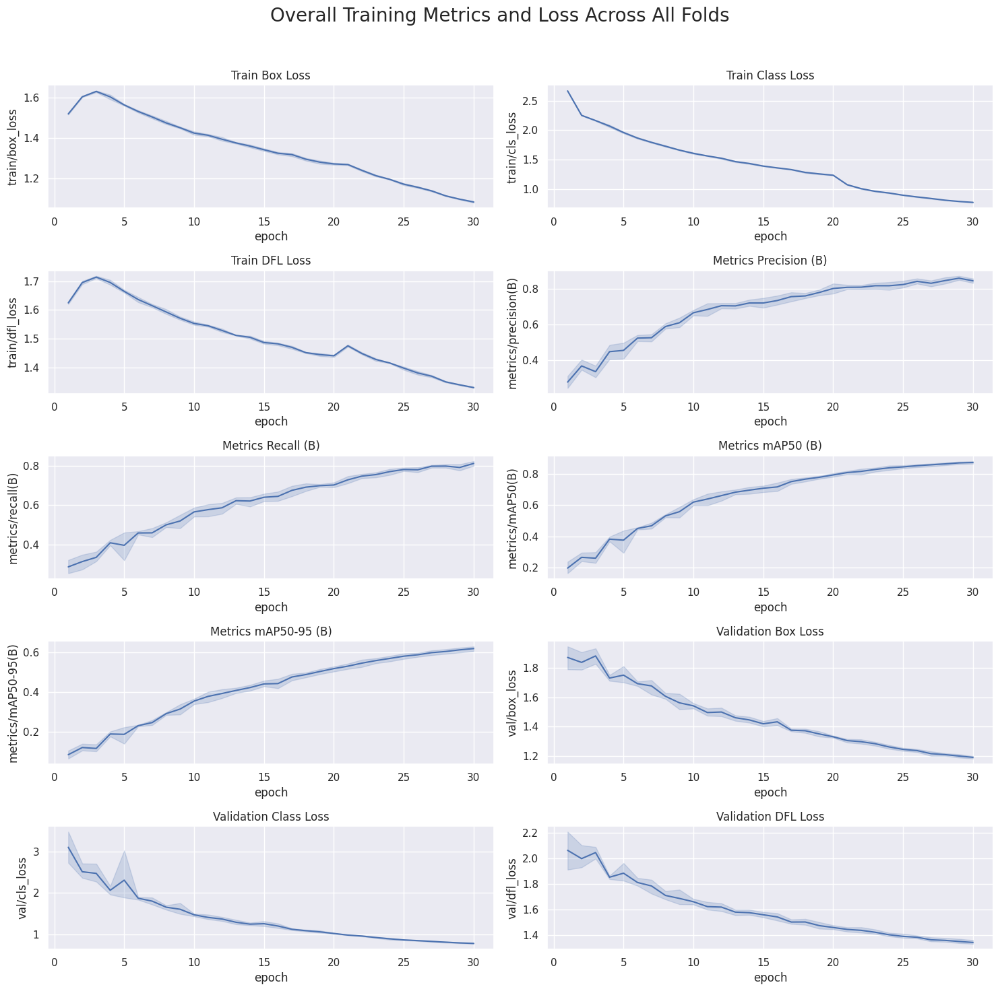

In [16]:
import pandas as pd
import os
import seaborn as sns
import matplotlib.pyplot as plt

# Initialize list to store all folds' data
overall_results = []

for fold in range(1, k_folds + 1):
    file_path = f"/kaggle/working/fold_{fold}/train2/results.csv"  # Path for each fold
    
    if os.path.exists(file_path):
        print(f"\nLoading and Plotting Results for Fold {fold}...\n")
        
        results = pd.read_csv(file_path)
        results.columns = results.columns.str.strip()  # Clean column names
        overall_results.append(results)

        # Create subplots for the fold
        fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

        # Plot training and validation metrics
        sns.lineplot(x='epoch', y='train/box_loss', data=results, ax=axs[0,0])
        sns.lineplot(x='epoch', y='train/cls_loss', data=results, ax=axs[0,1])
        sns.lineplot(x='epoch', y='train/dfl_loss', data=results, ax=axs[1,0])
        sns.lineplot(x='epoch', y='metrics/precision(B)', data=results, ax=axs[1,1])
        sns.lineplot(x='epoch', y='metrics/recall(B)', data=results, ax=axs[2,0])
        sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=results, ax=axs[2,1])
        sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=results, ax=axs[3,0])
        sns.lineplot(x='epoch', y='val/box_loss', data=results, ax=axs[3,1])
        sns.lineplot(x='epoch', y='val/cls_loss', data=results, ax=axs[4,0])
        sns.lineplot(x='epoch', y='val/dfl_loss', data=results, ax=axs[4,1])

        # Set titles for each subplot
        titles = [
            "Train Box Loss", "Train Class Loss", "Train DFL Loss", "Metrics Precision (B)",
            "Metrics Recall (B)", "Metrics mAP50 (B)", "Metrics mAP50-95 (B)",
            "Validation Box Loss", "Validation Class Loss", "Validation DFL Loss"
        ]
        
        for ax, title in zip(axs.flat, titles):
            ax.set_title(title)

        plt.suptitle(f'Training Metrics and Loss - Fold {fold}', fontsize=20)
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()
    else:
        print(f"Warning: Results file not found for Fold {fold}.")

# Compute and plot overall results
if overall_results:
    overall_df = pd.concat(overall_results, ignore_index=True)

    print("\nPlotting Overall Results Across All Folds...\n")

    # Create subplots for overall visualization
    fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

    sns.lineplot(x='epoch', y='train/box_loss', data=overall_df, ax=axs[0,0])
    sns.lineplot(x='epoch', y='train/cls_loss', data=overall_df, ax=axs[0,1])
    sns.lineplot(x='epoch', y='train/dfl_loss', data=overall_df, ax=axs[1,0])
    sns.lineplot(x='epoch', y='metrics/precision(B)', data=overall_df, ax=axs[1,1])
    sns.lineplot(x='epoch', y='metrics/recall(B)', data=overall_df, ax=axs[2,0])
    sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=overall_df, ax=axs[2,1])
    sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=overall_df, ax=axs[3,0])
    sns.lineplot(x='epoch', y='val/box_loss', data=overall_df, ax=axs[3,1])
    sns.lineplot(x='epoch', y='val/cls_loss', data=overall_df, ax=axs[4,0])
    sns.lineplot(x='epoch', y='val/dfl_loss', data=overall_df, ax=axs[4,1])

    for ax, title in zip(axs.flat, titles):
        ax.set_title(title)

    plt.suptitle("Overall Training Metrics and Loss Across All Folds", fontsize=20)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()
else:
    print("No results found across folds.")


In [27]:
import os
from ultralytics import YOLO

# Initialize variables to track the best model
best_model_path = ""
best_map50 = 0

# Path to the overall dataset YAML file
overall_data_yaml = "/kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/data.yaml"

# Iterate over all folds to find the best-performing model
for fold in range(1, 6):  # Loop through fold_1 to fold_5
    model_path = f"/kaggle/working/fold_{fold}/train2/weights/best.pt"
    fold_data_yaml = f"/kaggle/working/fold_{fold}/data.yaml"  # Each fold's data.yaml

    # Check if model and data.yaml exist
    if not os.path.exists(model_path):
        print(f"Skipping Fold {fold}: Model not found at {model_path}")
        continue
    if not os.path.exists(fold_data_yaml):
        print(f"Skipping Fold {fold}: data.yaml not found at {fold_data_yaml}")
        continue

    # Load the model and evaluate on fold-specific data
    Valid_model = YOLO(model_path)
    metrics = Valid_model.val(data=fold_data_yaml)

    # Extract mAP50 correctly
    fold_map50 = metrics.box.map50  # Corrected method to access mAP50

    # Check if this model is the best so far
    if fold_map50 > best_map50:
        best_map50 = fold_map50
        best_model_path = model_path

# Load the best-performing model for final validation using the overall dataset
if best_model_path:
    print(f"\nBest Model Selected: {best_model_path} with mAP50: {best_map50:.4f}\n")
    Final_Valid_Model = YOLO(best_model_path)
    final_metrics = Final_Valid_Model.val(data=overall_data_yaml)
    print("\nFinal Validation Complete!\n")
else:
    print("\nNo valid model found across all folds. Check your paths.\n")


Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


val: Scanning /kaggle/working/fold_1/valid/labels.cache... 1462 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1462/1462 [00:00<?, ?it/s]

val: WARNING ⚠️ /kaggle/working/fold_1/valid/images/obj1218_frame0000050_jpg.rf.4cc583ce533567da933951eafb1a3604.jpg: 1 duplicate labels removed



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:12<00:00,  7.47it/s]


                   all       1462       2118      0.829      0.793       0.86      0.595
                   Bio        323        473      0.824      0.757      0.843       0.59
                   Rov        225        278      0.748      0.784      0.818      0.606
                 Trash       1147       1367      0.915      0.838      0.919      0.589
Speed: 0.4ms preprocess, 4.3ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs/detect/val9
Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


val: Scanning /kaggle/working/fold_2/valid/labels.cache... 1462 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1462/1462 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:12<00:00,  7.38it/s]


                   all       1462       2121       0.87      0.817      0.881      0.628
                   Bio        329        449      0.907       0.82      0.891      0.637
                   Rov        227        303      0.793      0.835      0.863       0.68
                 Trash       1146       1369       0.91      0.797      0.889      0.566
Speed: 0.4ms preprocess, 4.4ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/val10
Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


val: Scanning /kaggle/working/fold_3/valid/labels.cache... 1462 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1462/1462 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:12<00:00,  7.31it/s]


                   all       1462       2229      0.845      0.797      0.868      0.611
                   Bio        311        482      0.773       0.78      0.846      0.597
                   Rov        248        320      0.858      0.809      0.878       0.67
                 Trash       1165       1427      0.905        0.8       0.88      0.565
Speed: 0.4ms preprocess, 4.4ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/val11
Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


val: Scanning /kaggle/working/fold_4/valid/labels.cache... 1461 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1461/1461 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:12<00:00,  7.32it/s]


                   all       1461       2281      0.827      0.822      0.871       0.62
                   Bio        330        453      0.818      0.811      0.877      0.639
                   Rov        224        283      0.764      0.894      0.876      0.671
                 Trash       1153       1545      0.898      0.762      0.859      0.549
Speed: 0.4ms preprocess, 4.3ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/val12
Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


val: Scanning /kaggle/working/fold_5/valid/labels.cache... 1461 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1461/1461 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 92/92 [00:12<00:00,  7.41it/s]


                   all       1461       2123      0.856      0.823      0.885      0.635
                   Bio        279        380      0.855      0.771      0.845      0.629
                   Rov        241        304      0.817      0.868      0.903      0.696
                 Trash       1187       1439      0.896      0.829      0.906      0.578
Speed: 0.4ms preprocess, 4.4ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/val13

Best Model Selected: /kaggle/working/fold_5/train2/weights/best.pt with mAP50: 0.8848

Ultralytics 8.3.97 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5nu summary (fused): 84 layers, 2,503,529 parameters, 0 gradients, 7.1 GFLOPs


val: Scanning /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/valid/labels... 1795 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1795/1795 [00:13<00:00, 131.43it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/valid is not writeable, cache not saved.


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 113/113 [00:15<00:00,  7.15it/s]


                   all       1795       2578      0.904       0.86      0.928      0.683
                   Bio        419        491      0.916      0.904      0.955      0.731
                   Rov        310        400      0.854      0.847      0.908      0.708
                 Trash       1408       1687       0.94      0.828       0.92      0.609
Speed: 0.4ms preprocess, 4.4ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/val14

Final Validation Complete!




image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0001_frame0000260_jpg.rf.a05c0126cfb2ef0d673c215f823e4cca.jpg: 640x640 2 Bios, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


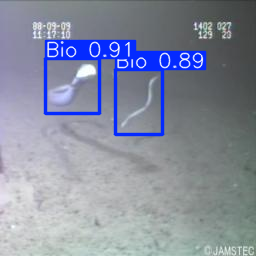


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/FishDataset102_png_jpg.rf.5110b88bf29970cee30d9da601a9d579.jpg: 640x640 1 Bio, 7.1ms
Speed: 2.0ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


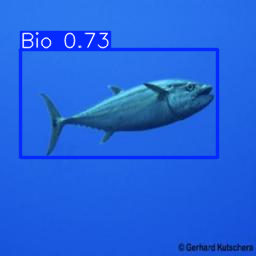


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1655_frame0000210_jpg.rf.db7d601afc8383ff06035ed11b311b5f.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


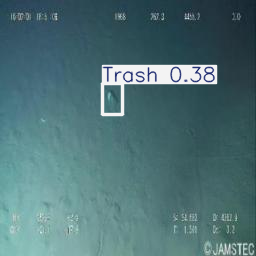


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1662_frame0000160_jpg.rf.c5d5ab90f9d93ec5988db9717575cbbd.jpg: 640x640 1 Rov, 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


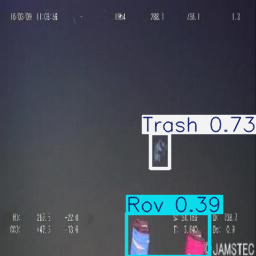


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/vid_000255_frame0000095_jpg.rf.4f247b25e50fdbc75797265d23a957d9.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


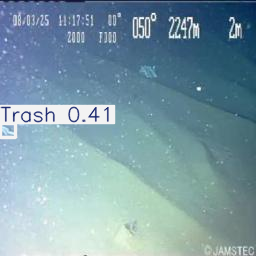


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0317_frame0000007_jpg.rf.2784ca46d2a1d98f680a6ff80def1879.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


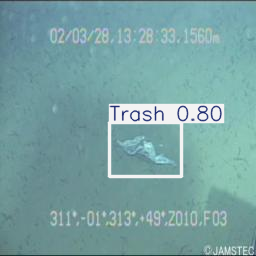


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1294_frame0000044_jpg.rf.062045f806a07b151d39ff98dc567fe9.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


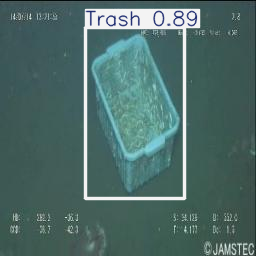


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/FishDataset586_png_jpg.rf.881bba9adb6c9c6eef2a83d1f783fb03.jpg: 640x640 2 Bios, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


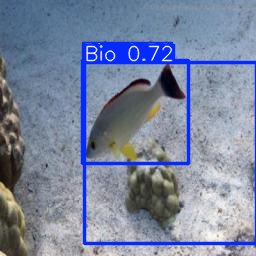


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0014_frame0000102_jpg.rf.04ceb8c8ef72b9fe7f018e32f93bd9b7.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


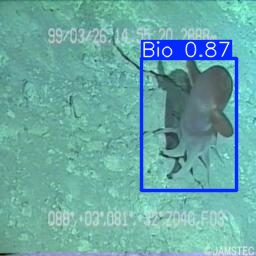


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/22_jpg.rf.018cec93a69760a1c25414598cc4dabc.jpg: 640x640 2 Trashs, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


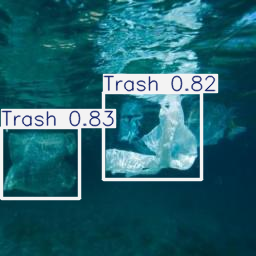


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0016_frame0000241_jpg.rf.0ced72fdec30ff1adae7b41c1f00e49c.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


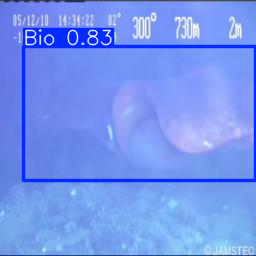


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1654_frame0000225_jpg.rf.7aaf258321ef1ce5a782d68a251c0dcc.jpg: 640x640 1 Rov, 1 Trash, 7.3ms
Speed: 2.0ms preprocess, 7.3ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


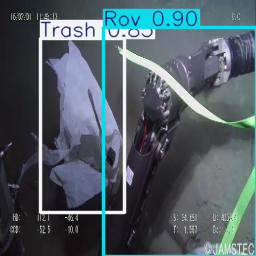


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1523_frame0000049_jpg.rf.ca3d4ca53acead931b6a45f03a962579.jpg: 640x640 1 Trash, 7.6ms
Speed: 1.9ms preprocess, 7.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


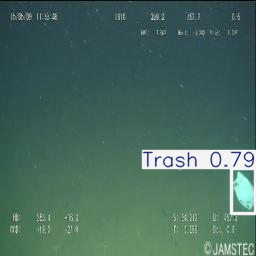


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0347_frame0000084_jpg.rf.01833a23f300106a5a0881cf902c97eb.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


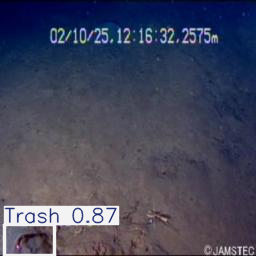


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0014_frame0000255_jpg.rf.0c22f89ee3ad7ac85f88c19fc0169cca.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


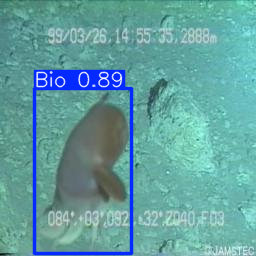


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0308_frame0000026_jpg.rf.d3e91837abca01f12d9c28f04a372b79.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


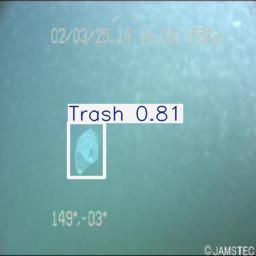


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/frame_01775_png_jpg.rf.a1d2f1f8f720531e2b3fc9239157d2a1.jpg: 640x640 (no detections), 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


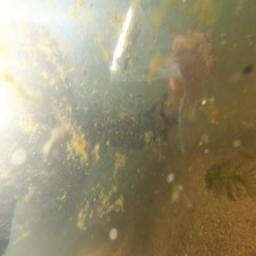


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0016_frame0000424_jpg.rf.20a56d0aa79a7045d1a2c675c0121d58.jpg: 640x640 2 Bios, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


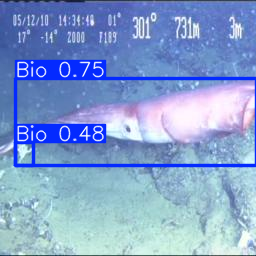


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0012_frame0000069_jpg.rf.9faa9ba47e40a6e7c6a22376ba1b8dac.jpg: 640x640 1 Bio, 9.9ms
Speed: 2.2ms preprocess, 9.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


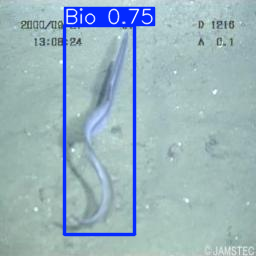


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/vid_000144_frame0000041_jpg.rf.2e1f99854279827a7ad7a6c34ca8ce60.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


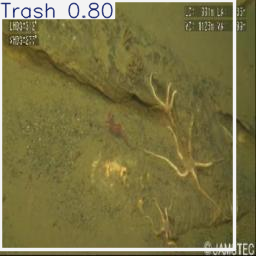


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/vid_000079_frame0000017_jpg.rf.51ef9a139c619547d6a7eb2a12630ad1.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


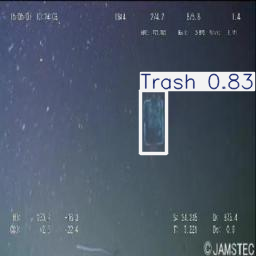


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1107_frame0000079_jpg.rf.b25f65b7fe34c2427b42b15fa1da7add.jpg: 640x640 1 Rov, 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


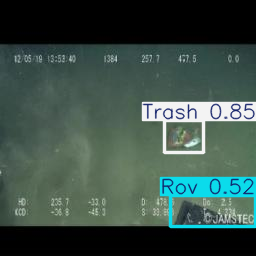


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/frame_01380_png_jpg.rf.9e9c3bcddc2cc1153b566ea68ae15d15.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


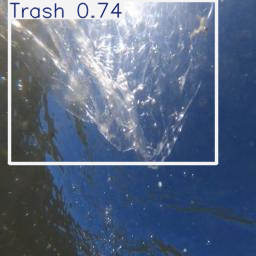


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0011_frame0000515_jpg.rf.d5670999791586b4483d5cd04ab41b3c.jpg: 640x640 1 Bio, 7.2ms
Speed: 1.8ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


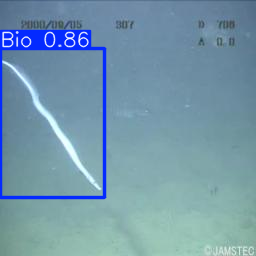


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/vid_000045_frame0000039_jpg.rf.e06dd4aa2483543bf06212ed67993b05.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


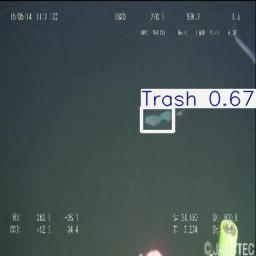


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0865_frame0000087_jpg.rf.75dffbfe6aa3db8c94f218af5f3eb65a.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


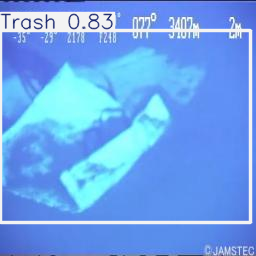


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0015_frame0000683_jpg.rf.c848f6b1a3d23391049f4326cb589839.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


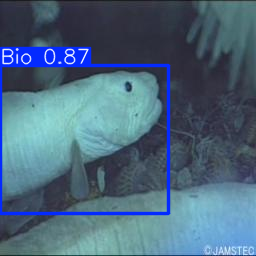


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1108_frame0000161_jpg.rf.14e10a3f376bd51070927b3d41ace871.jpg: 640x640 2 Rovs, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


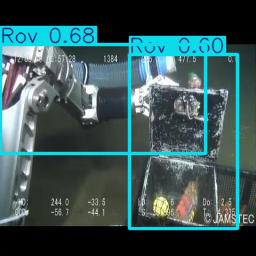


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/frame_00300_png_jpg.rf.fa4725d9aae6759daa496bfc1820c91e.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


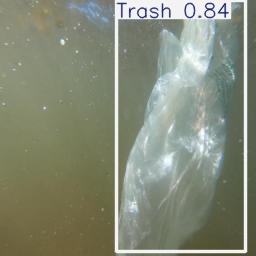


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1602_frame0000030_jpg.rf.59c8be45d7a3c5b0e4ccd6d4740d2842.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


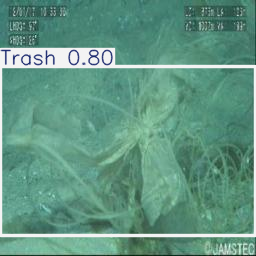


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1662_frame0000249_jpg.rf.4fc6a02a944faf67fd052e10a20f6bbe.jpg: 640x640 1 Rov, 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


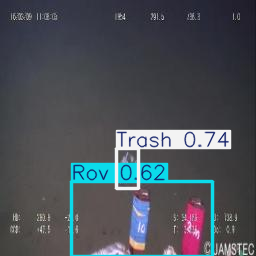


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/vid_000277_frame0000010_jpg.rf.1e8b029974aed2913b770a298b474643.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


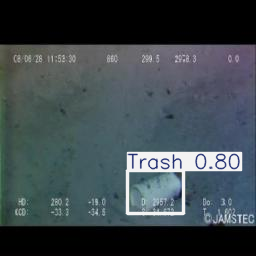


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0002_frame0000561_jpg.rf.6140cdc6c172a4083490388b556b3a24.jpg: 640x640 1 Bio, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


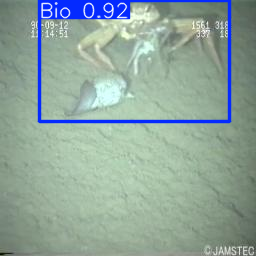


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/frame_01065_png_jpg.rf.d49a0517d030a584fd423cdd46f7cfcd.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


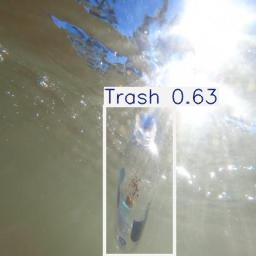


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0016_frame0000373_jpg.rf.b09c6aea84c32a41e6e1299582b6f61c.jpg: 640x640 4 Bios, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


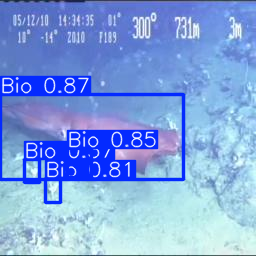


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0002_frame0000039_jpg.rf.037d128c45a479e61d2ca102fc535781.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


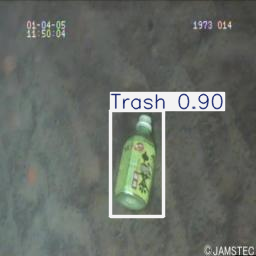


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/FishDataset26_png_jpg.rf.c2a5fe1d2d313d75502a3ec07af07c4f.jpg: 640x640 (no detections), 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


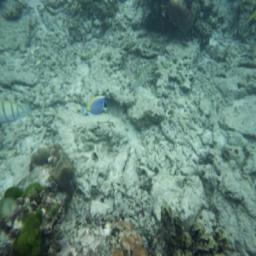


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0015_frame0000464_jpg.rf.3402795ef98a59ce7f6f283d2e821732.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


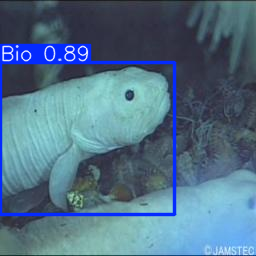


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0707_frame0000009_jpg.rf.06b2d2f636796f3a4168588713881f0e.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


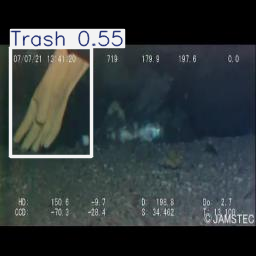


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/frame_00930_png_jpg.rf.a13f4103c2dd45c9900999ad32fa55da.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


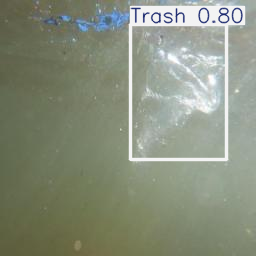


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0002_frame0000164_jpg.rf.19357ed69500de68008d895b98eaf435.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


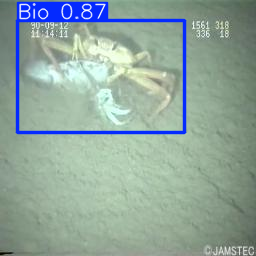


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0015_frame0000251_jpg.rf.4d2aa494ac2ce41271b06ac951aa1c6d.jpg: 640x640 4 Bios, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


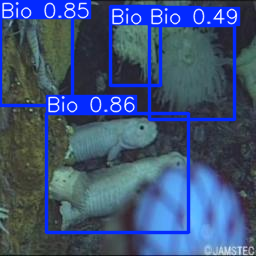


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0015_frame0000343_jpg.rf.b94fe817c5e24a595afc71759a370506.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


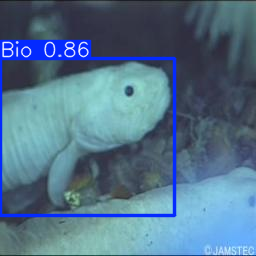


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0002_frame0000214_jpg.rf.2d25e6c79372be5741efbac0712b3fe0.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


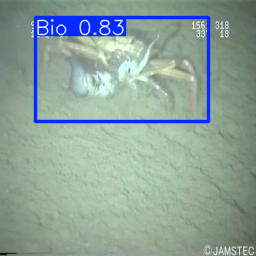


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0012_frame0000135_jpg.rf.e87510a6cb23abf08779c3d534453da1.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


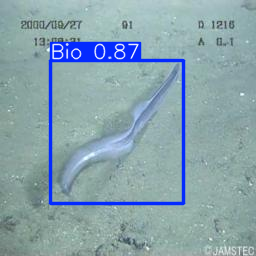


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/frame_00475_png_jpg.rf.5319e092cc6f6d6e25b18a029aef162d.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


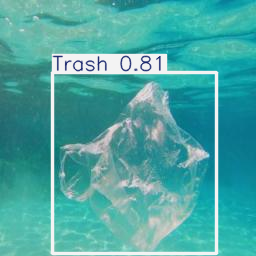


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0308_frame0000022_jpg.rf.c02ea032241613bc2512deb0e9e801e0.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


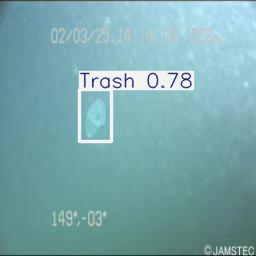


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1255_frame0000066_jpg.rf.5e59eb09bcb8143fb9cc24bc7b03a2fc.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


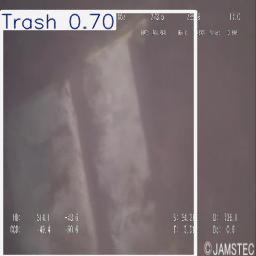


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0001_frame0000023_jpg.rf.e28ccbb68fde6d0a071939f9259108ca.jpg: 640x640 1 Bio, 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


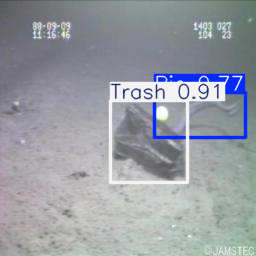


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0312_frame0000037_jpg.rf.3dff31e24539e5d9385f6e209a81fa96.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


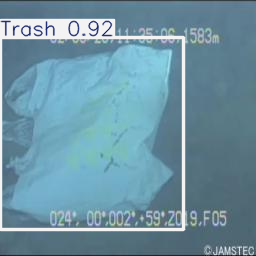


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/vid_000284_frame0000031_jpg.rf.c4bbb025b77f93fce8f96b20835197e2.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


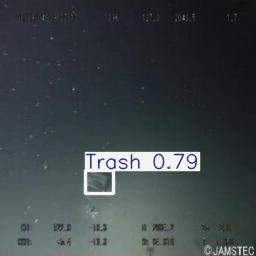


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1602_frame0000073_jpg.rf.5c483f09b50825f7bb19f8137cf34e6d.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


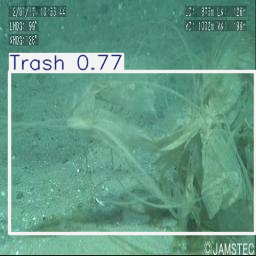


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0348_frame0000081_jpg.rf.9965e0a031124b8b6aefccc1e0b0e7da.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


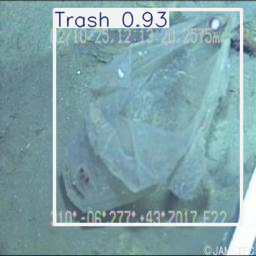


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1218_frame0000067_jpg.rf.3bf37cb930dbd8f302b34a7d4a3ff46d.jpg: 640x640 1 Rov, 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


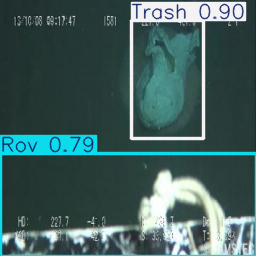


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1648_frame0000252_jpg.rf.2c0cd0ff017f27e0d142cf99af1fe650.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


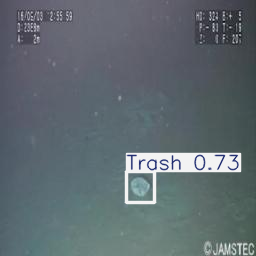


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/frame_01400_png_jpg.rf.8e1c782d964222dd4eec63d9d9924236.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


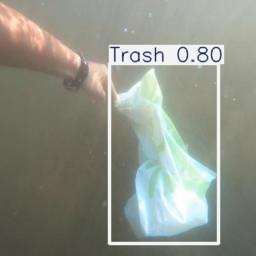


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1502_frame0000313_jpg.rf.aa0c99d7a5ddb4fa0402a73c9538c77d.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


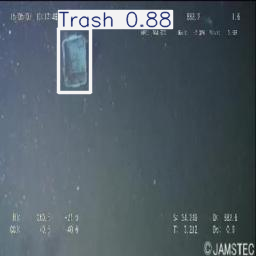


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1652_frame0000034_jpg.rf.27311971024470d5fa522194076127a6.jpg: 640x640 1 Rov, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


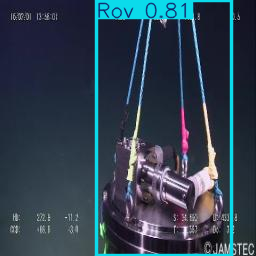


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/frame_00975_png_jpg.rf.46c05badd44819da359dab0b0ce08767.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


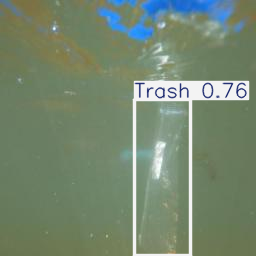


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0017_frame0000037_jpg.rf.643608e800f0f892e711280e8b213319.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


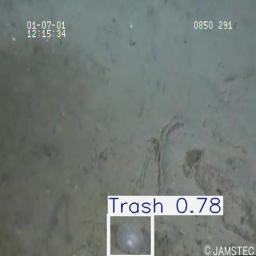


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/frame_01275_png_jpg.rf.88d8f77945ad6d38bb3f27bccbd9d79c.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


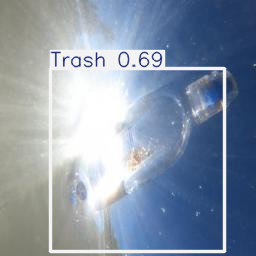


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/10_jpg.rf.14e925b316f259bd7789917b07fdaa05.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


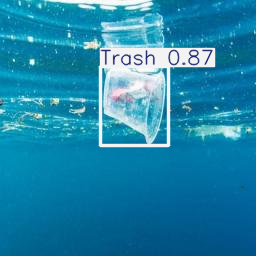


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1629_frame0000011_jpg.rf.37d4e2df0ed5dae42c85744abe15619d.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


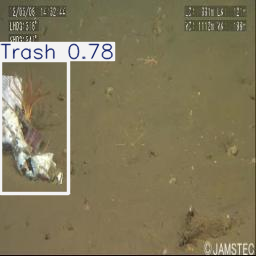


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1617_frame0000043_jpg.rf.b639fb4aa6d620c09cd3d04599342829.jpg: 640x640 2 Rovs, 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


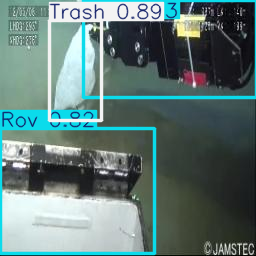


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0214_frame0000007_jpg.rf.4039a3d25e1ac15fb22744b3f00e311b.jpg: 640x640 2 Trashs, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


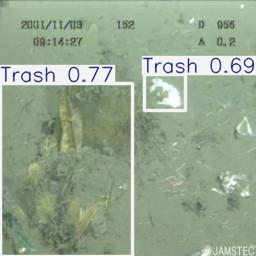


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0334_frame0000071_jpg.rf.b7abf3077c0ad527dfc3e7290c5dc87e.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


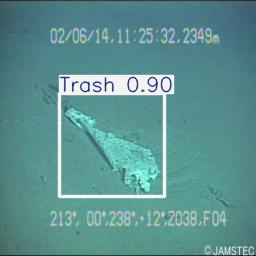


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1654_frame0000066_jpg.rf.455235e7ca8c5b161feae4d941c2f10d.jpg: 640x640 1 Rov, 1 Trash, 7.7ms
Speed: 1.9ms preprocess, 7.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


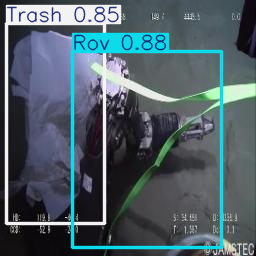


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1505_frame0000033_jpg.rf.0fef8d3cc49df1f37b67e202a03c3fcb.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


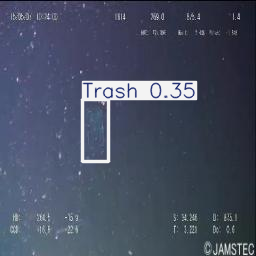


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0309_frame0000045_jpg.rf.b3c875d7a412550085addab0b9259313.jpg: 640x640 3 Trashs, 7.2ms
Speed: 1.9ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


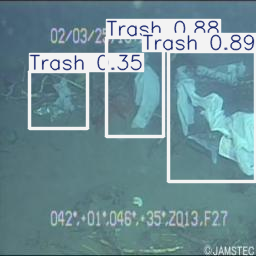


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1658_frame0001852_jpg.rf.ef14485d07cd6ff6ad46f7594d8b78e3.jpg: 640x640 2 Rovs, 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


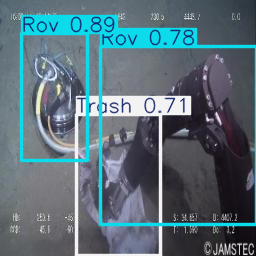


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0308_frame0000028_jpg.rf.ec91051dc8cb91cbfeb77a73c60cf1d5.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


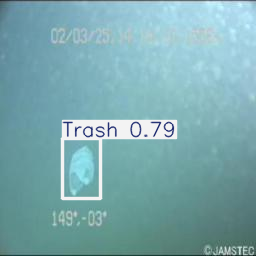


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0011_frame0000352_jpg.rf.b527b805e94bac8bf5ae77c9e79d007c.jpg: 640x640 1 Bio, 7.2ms
Speed: 1.9ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


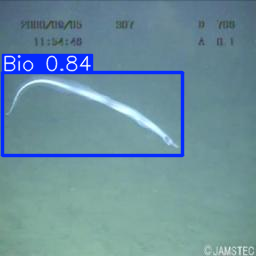


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/frame_00105_png_jpg.rf.38aa6c47bb9c4ecdc9e1b3b8b6f6234e.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


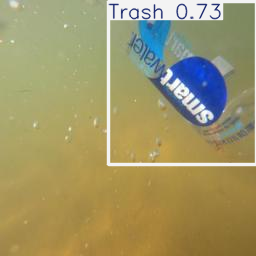


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1202_frame0000050_jpg.rf.6de6dcb23a56421c02e1215cf0681a24.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


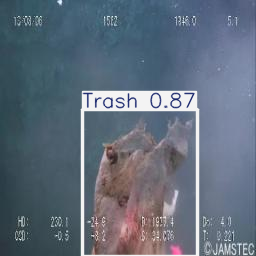


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1050_frame0000079_jpg.rf.2388ca3b572eb324f7e4977451698114.jpg: 640x640 3 Rovs, 2 Trashs, 7.2ms
Speed: 1.8ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


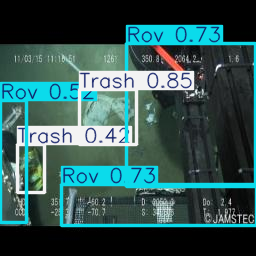


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/frame_01350_png_jpg.rf.904cac6e897061062e5ee696a82067e5.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


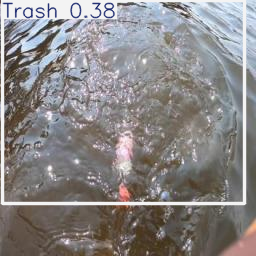


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0337_frame0000025_jpg.rf.148ecbd35d29f3319c6da461271e3b78.jpg: 640x640 1 Trash, 7.8ms
Speed: 1.9ms preprocess, 7.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


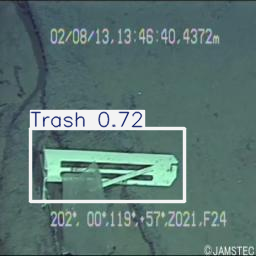


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/vid_000297_frame0000003_jpg.rf.a3930b376a597a67418f562bc4b08bc1.jpg: 640x640 2 Trashs, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


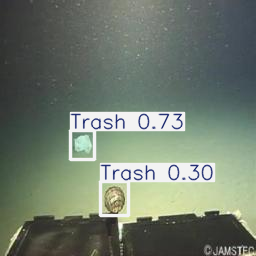


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/vid_000214_frame0000001_jpg.rf.4b7a9be03a29befd1638e83ad06c7e5a.jpg: 640x640 3 Rovs, 2 Trashs, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


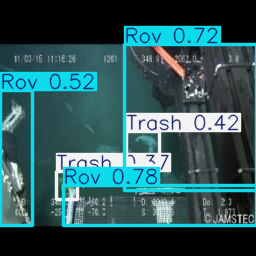


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0000_frame0000276_jpg.rf.99e004813ebed7454aaea111f37ddf1c.jpg: 640x640 1 Bio, 7.2ms
Speed: 1.9ms preprocess, 7.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


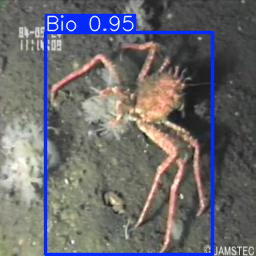


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0319_frame0000067_jpg.rf.ee35fe0d1237542164ceb238a0374695.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


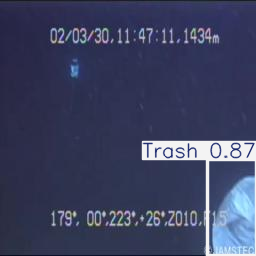


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1505_frame0000214_jpg.rf.eadcf7c2176114a3ffb6c5117f7ebb8b.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


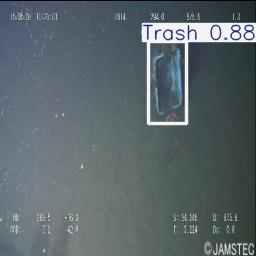


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0301_frame0000009_jpg.rf.847f2f3cc9f450955f369941c6fe6d2f.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


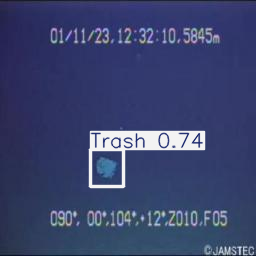


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0012_frame0000329_jpg.rf.79757b2765cb8f076b65e276f26ce1d2.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


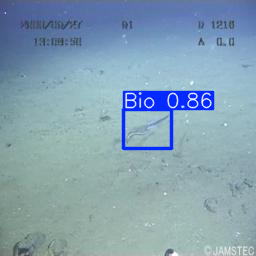


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1294_frame0000007_jpg.rf.65b25c7fc7f2d9e2f8ed4c2e2321ad67.jpg: 640x640 1 Rov, 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


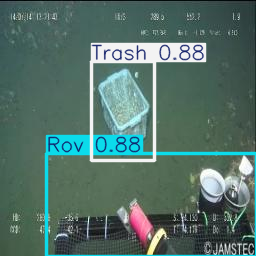


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1657_frame0000076_jpg.rf.6408e0bdf03d94d9e06a7d0622b6844a.jpg: 640x640 1 Rov, 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


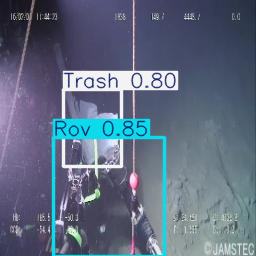


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0015_frame0000122_jpg.rf.6aae9ecb72498d228930451094aef94d.jpg: 640x640 4 Bios, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


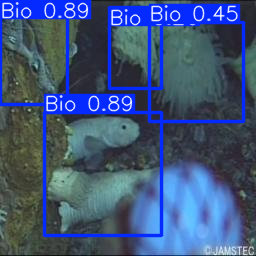


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1616_frame0000067_jpg.rf.a8a89ed2d236300ddfccb332026dd0bb.jpg: 640x640 1 Rov, 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


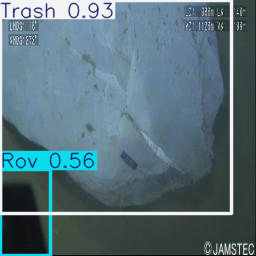


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0319_frame0000055_jpg.rf.0b5d5d0a462bf4277ae12e9825abf178.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.3ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


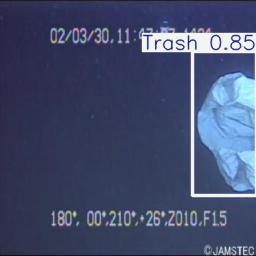


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0002_frame0000093_jpg.rf.2791a8b90f9b045b104034b111175bad.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


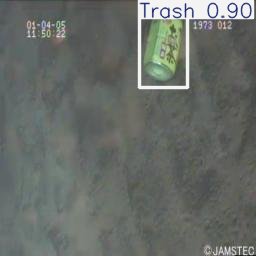


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1218_frame0000040_jpg.rf.17953b7cd4988ffe64b0887be88cd1d3.jpg: 640x640 1 Rov, 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


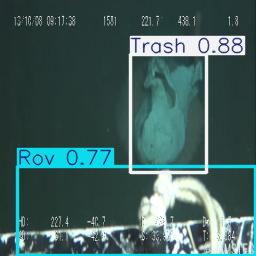


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0004_frame0000125_jpg.rf.8a710e30ad56fafa7f59d5c676fecb70.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


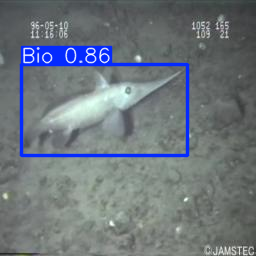


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0301_frame0000036_jpg.rf.1bc311772c589af8f9ee6a7ae8864766.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


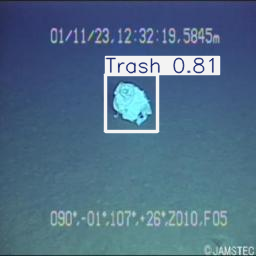


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0001_frame0000414_jpg.rf.47dce1536de844e02f1304dc18fcd91f.jpg: 640x640 1 Bio, 2 Rovs, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


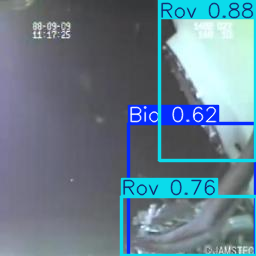


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1626_frame0000020_jpg.rf.7e0c14550d099d1fef351025138a37fc.jpg: 640x640 1 Rov, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


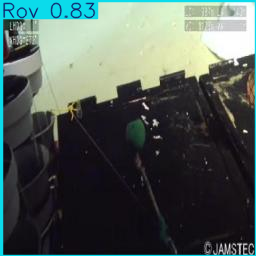


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/vid_000303_frame0000008_jpg.rf.0a06a3e33e7f00c17b39631f6314c969.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


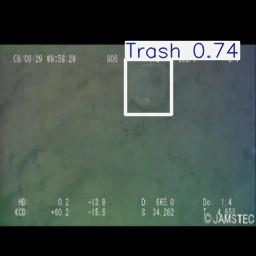


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0002_frame0000576_jpg.rf.a69523e46d312b06f405aed63accd77f.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


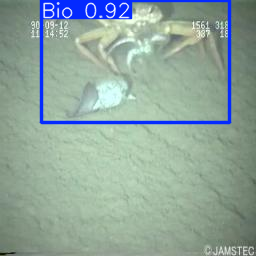


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0789_frame0000019_jpg.rf.d1a93ab27d47ff6d8f8a9bbd9497cb36.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


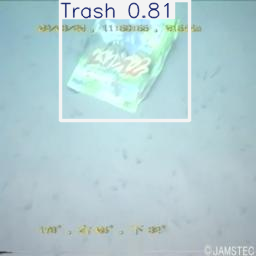


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0702_frame0000036_jpg.rf.e65c5ec03ff3420d87aa86afc6ed352c.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


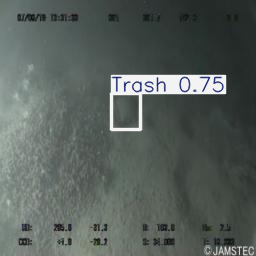


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/frame_00900_png_jpg.rf.03daad42da252e48a12eff960bc269b1.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


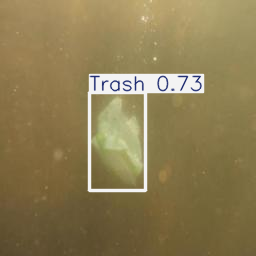


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0017_frame0000030_jpg.rf.a952d5e44b0ff387fa134b5e63760713.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


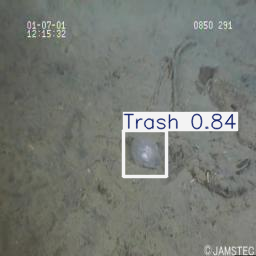


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0016_frame0000293_jpg.rf.0671ad799562a6dacc7d849de94b79f0.jpg: 640x640 1 Bio, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


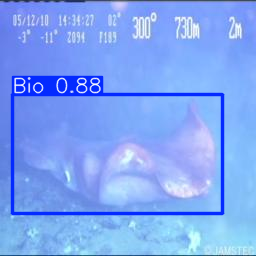


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0312_frame0000053_jpg.rf.639749edc3a569e5abf7d5a5494d7657.jpg: 640x640 1 Trash, 7.1ms
Speed: 2.0ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


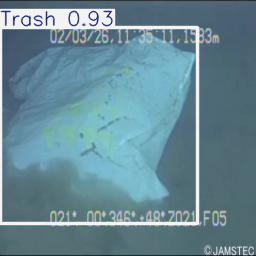


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0001_frame0000103_jpg.rf.999a1daac28ffd94a91cf10f57487f4c.jpg: 640x640 1 Bio, 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


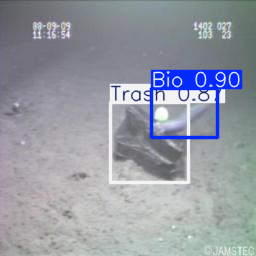


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0015_frame0000164_jpg.rf.dab56ed8f088ef8df8f5298ba5aea521.jpg: 640x640 3 Bios, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


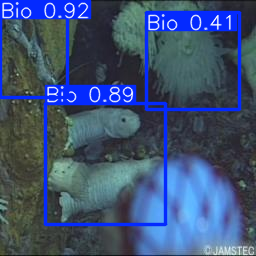


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0747_frame0000340_jpg.rf.f8c21fd5546c7a130c2f1328a363b910.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


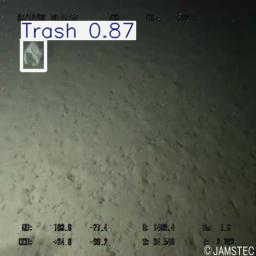


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/frame_00300_png_jpg.rf.42528c72614421ddac9db660682d82f8.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


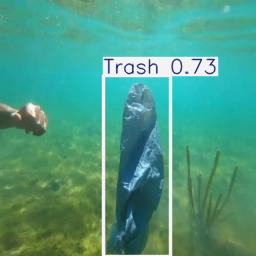


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0000_frame0000053_jpg.rf.02f25f0f3735379e43daf96671086b94.jpg: 640x640 2 Bios, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


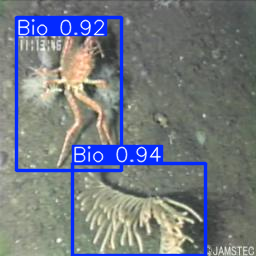


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/bio0001_frame0000123_jpg.rf.9d8cdcbbc339ae588e33a1fa7233c665.jpg: 640x640 1 Bio, 2 Trashs, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


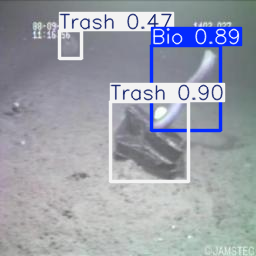


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1658_frame0001411_jpg.rf.d726bd9cde2135804b010db6c9103655.jpg: 640x640 2 Rovs, 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


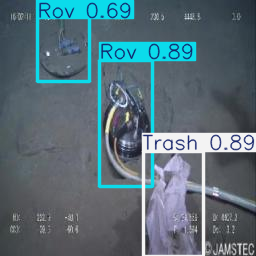


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/vid_000539_frame0000062_jpg.rf.75c1004d5ad297a997b3ad1d35bb183b.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


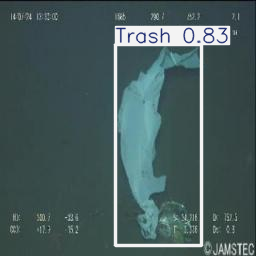


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0228_frame0000023_jpg.rf.810edc207a7334c79f633ac22988f66b.jpg: 640x640 1 Bio, 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


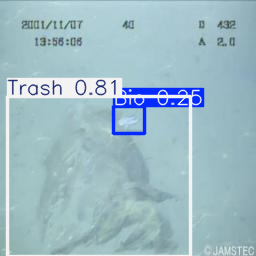


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/vid_000052_frame0000022_jpg.rf.4e009ebd0f835fabf38f993a97150ded.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


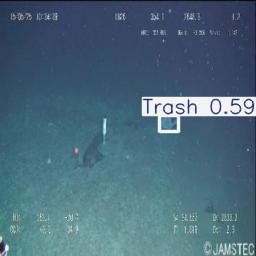


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/frame_01770_png_jpg.rf.01f85f41d56c677718b4f43aeea61034.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


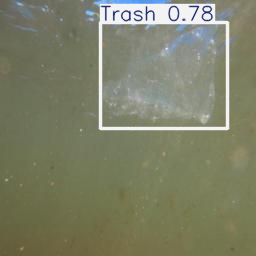


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0000_frame0000007_jpg.rf.3400afce4674e4dc3fb2d73ad4b43cf7.jpg: 640x640 1 Rov, 1 Trash, 7.2ms
Speed: 1.9ms preprocess, 7.2ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


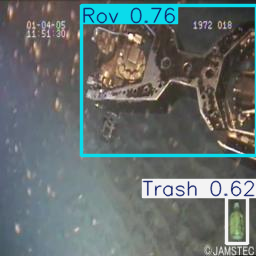


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj0017_frame0000027_jpg.rf.95339b1149b177cfdb10d6f557a497a3.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


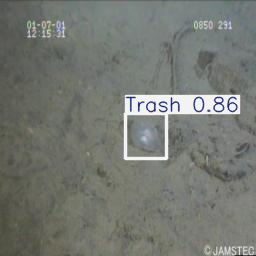


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/frame_00025_png_jpg.rf.e5c7a4d1963389bdfcfc611af016bfdd.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


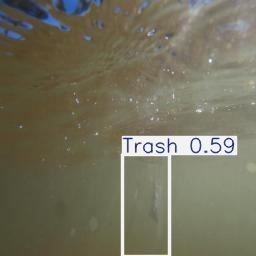


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/obj1648_frame0000225_jpg.rf.dfb441d61e818b7d8db57daf7e3c922d.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.8ms preprocess, 7.1ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


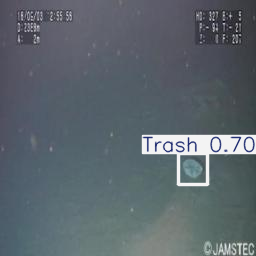


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/frame_00300_png_jpg.rf.9a3a6ac5ec6dc0099ddb43190f61a815.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


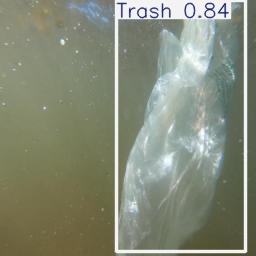


image 1/1 /kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images/vid_000158_frame0000048_jpg.rf.ab997fa211e5c012274d348546a4b542.jpg: 640x640 1 Trash, 7.1ms
Speed: 1.9ms preprocess, 7.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


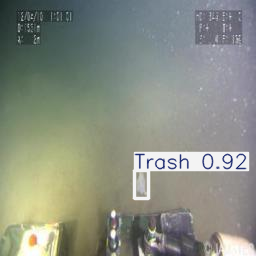

In [29]:
images = os.listdir("/kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images")
for i in range(120):
    image = os.path.join("/kaggle/input/underwater-trash-detection/utd2.v8i.yolov8/test/images", images[i])
    result_predict = Valid_model.predict(source = image, imgsz=(640), iou=0.4)

    # show results
    plot = result_predict[0].plot()
    plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
    display(Image.fromarray(plot))